In [1]:
import pickle #Used for loading in the stored dataframes of monthly yearly and seasonal data

%matplotlib inline

#! /usr/bin/env python3

# data libraries
import sys
import os #operating system
import datetime as dt  # Python standard library datetime module
import numpy as np #math for operations on data
from netCDF4 import Dataset,num2date  # http://code.google.com/p/netcdf4-python/
import pandas as pd #dataframe operators
from matplotlib.path import Path

# plotting libraries
import matplotlib.pyplot as plt 
import matplotlib.style as style
from matplotlib import cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point 
import cartopy.mpl.ticker as cticker
from cartopy.feature import LAND,BORDERS,OCEAN

#Printing Options For Figures
np.set_printoptions(threshold=sys.maxsize)

In [2]:
def bias_analysis_shelf(shelf_name,type_of_analysis):

    if type_of_analysis == 'yearly':
        shelf = yearly_shelves[shelf_name]
        shelf_reanalysis = yearly_reanalysis[shelf_name]
        
        y1 = shelf_reanalysis['year'][0][0]
        y2 = shelf_reanalysis['year'][0][-1]

        data_for_indicies_of_array_to_fill = yearly_shelves[shelf_name]['year'][0]

        index1_fill = np.where(data_for_indicies_of_array_to_fill == y1)[0][0]
        index2_fill = np.where(data_for_indicies_of_array_to_fill == y2)[0][-1]
        
        shelf_cropped = np.zeros((len(shelf['year']),len(shelf['year'][0][index1_fill:index2_fill])))
        shelf_cropped_temp = np.zeros((len(shelf['year']),len(shelf['year'][0][index1_fill:index2_fill]),len(shelf['cropped lon'][0])))
        shelf_cropped_temp_spatial_avg = np.zeros((len(shelf['year'])+1,len(shelf['year'][0][index1_fill:index2_fill])))
        
        for i in range(len(shelf['year'])):
            data_for_indicies = yearly_shelves[shelf_name]['year'][i]

            index1 = np.where(data_for_indicies == y1)[0][0]
            index2 = np.where(data_for_indicies == y2)[0][-1]
            
            shelf_cropped[i] = shelf['year'][i][index1:index2]
            shelf_cropped_temp[i] = shelf['cropped temp'][i][index1:index2]
            shelf_cropped_temp_spatial_avg[i] = shelf['temp spatial average'][i][index1:index2]
        
        model_names = list(shelf['Model'])
        
        model_mean = np.mean(shelf_cropped_temp_spatial_avg,axis=0)
        model_names.append('Model Mean')
        
        shelf_cropped_temp_spatial_avg[-1]= model_mean
        
        variation = shelf_cropped_temp_spatial_avg - shelf_reanalysis['temp spatial average'][0][0:-1]
        mean_bias = np.mean(variation,axis=1)
        

        #Making data frame for bias analysis
        df = pd.DataFrame(list(zip(model_names,mean_bias)),columns=['Model Names','Mean Bias'])

        df_sortted = df.sort_values("Mean Bias",ascending=False)

        x = df_sortted['Model Names']
        y = df_sortted['Mean Bias']

        cmap = plt.cm.seismic
        norm = cm.colors.TwoSlopeNorm(vcenter=0,vmin=np.min(y),vmax=np.max(y))

        fig = plt.figure()
        fig, (ax1,ax2) = plt.subplots(1, 2,figsize=(22, 10), tight_layout=False)
        #plt.tick_params(labelsize=20)
        plt.tight_layout()
        
        for i in range(len(shelf_cropped_temp)):
            ax1.plot(shelf_cropped[i],shelf_cropped_temp_spatial_avg[i],linewidth=1,label = '_nolegend_', color= 'lightgray')
        
        ax1.text(0.05, 0.9,'Shelf: {}'.format(shelf_name),fontsize = 20, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
        ax1.plot(shelf_cropped[0],model_mean,label = 'Ensemble Mean', color= 'orange')
        ax1.plot(shelf_reanalysis['year'][0],shelf_reanalysis['temp spatial average'][0],label = 'ERA5', color= 'blue')
        ax1.set_xlabel("Time(Years)", fontsize = 20)
        ax1.set_ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 22)
        ax1.tick_params(labelsize=16)
        ax1.legend(loc = 'lower right',fontsize=20)
        
        bars = ax2.barh(x,y,align='center',color=cmap(norm(y.values)))
        ax2.bar_label(bars,fmt = '%1.2f',padding=2,label_type='edge',fontsize=16)
        ax2.set_xlim(left=min(y)-1.5)
        ax2.set_xlim(right=max(y)+1.5)
        ax2.set_xlabel(r"Mean Annual Temperature Bias($\degree$ C)", fontsize = 22)
        ax2.yaxis.set_label_position("right")
        ax2.tick_params(labelsize=16)
        ax2.yaxis.tick_right()
    
        
        my_path = '/raid01/mafields/tas/MODELS_filtered/ssp585/figures/bias/shelves_yearly/' # Figures out the absolute path for you in case your working directory moves around.
        my_file = shelf_name + '_yearly_bias.png'
   
        plt.savefig(os.path.join(my_path, my_file), bbox_inches='tight')
    
    
    else: 
        shelf = seasonal_shelves[shelf_name]
        shelf_reanalysis = seasonal_reanalysis[shelf_name]
        
        y1 = shelf_reanalysis['year'][0][0]
        y2 = shelf_reanalysis['year'][0][-1]

        data_for_indicies_of_array_to_fill = yearly_shelves[shelf_name]['year'][0]

        index1_fill = np.where(data_for_indicies_of_array_to_fill == y1)[0][0]
        index2_fill = np.where(data_for_indicies_of_array_to_fill == y2)[0][-1]+1
        
        shelf_cropped = np.zeros((len(shelf['year']),len(shelf['year'][0][index1_fill:index2_fill])))
        shelf_cropped_temp = np.zeros((len(shelf['year']),len(shelf['year'][0][index1_fill:index2_fill]),len(shelf['original latitude'][0]),len(shelf['original longitude'][0])))
        shelf_cropped_temp_spatial_avg = np.zeros((len(shelf['year'])+1,len(shelf['year'][0][index1_fill:index2_fill])))

        for i in range(len(shelf['year'])):
            data_for_indicies = yearly_shelves[shelf_name]['year'][i]

            index1 = np.where(data_for_indicies == y1)[0][0]
            index2 = np.where(data_for_indicies == y2)[0][-1]+1
            
            shelf_cropped[i] = shelf['year'][i][index1:index2]
            shelf_cropped_temp[i] = shelf['temp'][i][index1:index2]
            shelf_cropped_temp_spatial_avg[i] = shelf['temp spatial average'][i][index1:index2]
            
        model_names = list(shelf['Model'])
        
        model_mean = np.mean(shelf_cropped_temp_spatial_avg,axis=0)
        model_names.append('Model Mean')
        
        
        shelf_cropped_temp_spatial_avg[-1]= model_mean
        
        variation = shelf_cropped_temp_spatial_avg - shelf_reanalysis['temp spatial average'][0][0:-1]
        mean_bias = np.mean(variation,axis=1)

        #Making data frame for bias analysis
        df = pd.DataFrame(list(zip(model_names,mean_bias)),columns=['Model Names','Mean Bias'])

        df_sortted = df.sort_values("Mean Bias",ascending=False)

        x = df_sortted['Model Names']
        y = df_sortted['Mean Bias']

        cmap = plt.cm.seismic
        norm = cm.colors.TwoSlopeNorm(vcenter=0,vmin=np.min(y),vmax=np.max(y))

        fig = plt.figure()
        fig, (ax1,ax2) = plt.subplots(1, 2,figsize=(22, 10), tight_layout=True)
        #plt.tick_params(labelsize=20)
        plt.tight_layout()
        
        for i in range(len(shelf_cropped_temp)):
            ax1.plot(shelf_cropped[i],shelf_cropped_temp_spatial_avg[i],linewidth=1,label = '_nolegend_', color= 'lightgray')
        
        ax1.text(0.05, 0.9,'Shelf: {}'.format(shelf_name),fontsize = 20, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
        ax1.plot(shelf_cropped[0],model_mean,label = 'Ensemble Mean', color= 'orange')
        ax1.plot(shelf_reanalysis['year'][0],shelf_reanalysis['temp spatial average'][0],label = 'ERA5', color= 'blue')
        ax1.set_xlabel("Time(Years)", fontsize = 20)
        ax1.set_ylabel(r"Austral Summer Surface Temperature ($\degree$ C)", fontsize = 20)
        ax1.tick_params(labelsize=16)
        ax1.legend(loc = 'lower right',fontsize=20)
        
        bars = ax2.barh(x,y,align='center',color=cmap(norm(y.values)))
        ax2.bar_label(bars,fmt = '%1.2f',padding=2,label_type='edge',fontsize=14)
        ax2.set_xlim(left=min(y)-1.5)
        ax2.set_xlim(right=max(y)+1.5)
        ax2.set_xlabel(r"Mean Austral Summer Temperature Bias($\degree$ C)", fontsize = 20)
        ax2.yaxis.set_label_position("right")
        ax2.tick_params(labelsize=16)
        ax2.yaxis.tick_right()
        
        my_path = '/raid01/mafields/tas/MODELS_filtered/ssp585/figures/bias/shelves_seasonal/' # Figures out the absolute path for you in case your working directory moves around.
        my_file = shelf_name + '_seasonal_bias.png'
   
        plt.savefig(os.path.join(my_path, my_file), bbox_inches='tight')
        
        #plt.close()

    return df, df_sortted

In [3]:
def iceshelf_dictionary(dictionary):

    for key in dictionary:    
        df_shelf, onset_df  = bias_analysis_monthly(key)
        shelf_bias_adjusted_dictionary[key] = df_shelf
        shelf_bias_adjusted_dictionary_onset[key] = onset_df
            
    task = 'completed task'
                
    return 

In [4]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/saved_data/monthly_shelves.pkl', 'rb') as f:
    monthly_shelves = pickle.load(f)

In [5]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/saved_data/yearly_shelves.pkl', 'rb') as f:
    yearly_shelves = pickle.load(f)

In [6]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/saved_data/reanalysis_monthly.pkl', 'rb') as f:
    monthly_reanalysis = pickle.load(f)

In [7]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/saved_data/reanalysis_yearly.pkl', 'rb') as f:
    yearly_reanalysis = pickle.load(f)

In [8]:
fname = '/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/saved_data/TT_IS.nc'
datain = Dataset(fname, 'r')

fname_1 = '/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/saved_data/dT_IS.nc'
datain1 = Dataset(fname_1, 'r')

TT = datain.variables['thresholdT'][:]
TT_uncertainty = datain1.variables['dTT'][:]


Names = ['Nansen','Drygalski','Ross West','Filchner','Ross East','Vigrid','Ronne','Amery',
        'Publications','Baudouin','Tracy Tremenchus','Lazarev','Rennick','LarsenB','Quar','Riiser-Larsen'
        'Brunt Stancomb','Tucker','Lily','Borchgrevink','Ekstrom','Mariner','Fimbul','Nivl','LarsenD'
        'Bach','LarsenC','LarsenE','Cook','West','Cosgrove','Jelbart','Sulzberger','Conger Glenzer',
        'Ninnis','Mertz','Pine Island','Shackleton','George VI','Moscow University','Nickerson','Prince Harald'
        ,'Wilkins','Thwaites','Frostman-Lord-Shuman-Anandakri','Stange','Getz','Slava','Dotson','Swinburne',
        'Crosson','Abbot','Totten','Land','Venable','Holmes']

Thresholds = pd.DataFrame(list(zip(Names,TT,TT_uncertainty)),columns=['Model Names','Threshold Temps','Temp Uncertainty'])

In [9]:
Thresholds

,Model Names,Threshold Temps,Temp Uncertainty
0,Nansen,-20.118471,2.011847
1,Drygalski,-20.925136,0.755822
2,Ross West,-20.570977,1.204529
3,Filchner,-17.713133,0.889902
4,Ross East,-18.728981,1.186594
5,Vigrid,-14.731370,0.760710
6,Ronne,-15.878980,0.657938
7,Amery,-20.228553,1.168172
8,Publications,-15.670661,1.567066
9,Baudouin,-12.936224,0.495351


In [10]:
def find_nearest(array, value):
        array = np.asarray(array)
        idx = (np.abs(array - value)).argmin()
        return array[idx], idx

In [13]:
def bias_analysis_monthly(shelf_name):

    shelf = monthly_shelves[shelf_name]
    shelf_reanalysis = monthly_reanalysis[shelf_name]
    
    time_yearly = yearly_shelves[shelf_name]['year'] 
    yearly_reanalysis_shelf = yearly_reanalysis[shelf_name]
    time_reanalysis = yearly_reanalysis_shelf['year'][0]
    temp_reanalysis = yearly_reanalysis_shelf['temp spatial average'][0]

    y1 = shelf_reanalysis['year'][0][0]
    y2 = shelf_reanalysis['year'][0][-1]

    data_for_indicies_of_array_to_fill = shelf['year'][0]

    index1_fill = np.where(data_for_indicies_of_array_to_fill == y1)[0][0]
    index2_fill = np.where(data_for_indicies_of_array_to_fill == y2)[0][-1]+1

    shelf_cropped_months = np.zeros((len(shelf['month']),len(shelf['month'][0][index1_fill:index2_fill])))
    shelf_cropped_years = np.zeros((len(shelf['year']),len(shelf['year'][0][index1_fill:index2_fill])))
    shelf_cropped_temp = np.zeros((len(shelf['month']),len(shelf['month'][0][index1_fill:index2_fill]),len(shelf['original latitude'][0]),len(shelf['original longitude'][0])))
    shelf_cropped_temp_spatial_avg = np.zeros((len(shelf['month'])+1,len(shelf['month'][0][index1_fill:index2_fill])))

    for i in range(len(shelf['month'])):
        data_for_indicies = shelf['year'][i]
        model_name = shelf['Model'][i]

        index1 = np.where(data_for_indicies == y1)[0][0]
        index2 = np.where(data_for_indicies == y2)[0][-1]+1

        shelf_cropped_months[i] = shelf['month'][i][index1:index2]
        shelf_cropped_years[i] = shelf['year'][i][index1:index2]
        shelf_cropped_temp[i] = shelf['temp'][i][index1:index2]
        shelf_cropped_temp_spatial_avg[i] = shelf['temp spatial average'][i][index1:index2]

    model_names = list(shelf['Model'])

    model_mean = np.mean(shelf_cropped_temp_spatial_avg,axis=0)

    model_names.append('Model Mean')

    shelf_cropped_temp_spatial_avg[-1]= model_mean

    variation = shelf_cropped_temp_spatial_avg - shelf_reanalysis['temp spatial average'][0]
    
    y1 = 1940
    y2 = 2099
    
    length_of_crop = y2-y1+1

    shelf_cropped_time = np.zeros((len(shelf['month']),length_of_crop))
    shelf_cropped_temp = np.zeros((len(shelf['month']),length_of_crop))

    monthly_averages_list = list()
    adjusted_model_list_month = list()
    adjusted_model_list_year = list()
    year_models = list()

    length = len(shelf_cropped_months)
    
    shelf_name_key = list()
    onset_time = list()
    onset_time_upper = list()
    onset_time_lower = list()
    onset_temp = list()
    onset_temp_uncertainty = list()
    model_mean_temp = list()


    for i in range(length):
        months = shelf_cropped_months[i]
        temp_original = shelf['temp spatial average'][i]
        year_original = shelf['year'][i]
        month_original = shelf['month'][i]
        variation_single_model = shelf_cropped_temp_spatial_avg[i] - shelf_reanalysis['temp spatial average'][0]
        df_per_model = pd.DataFrame(list(zip(months,variation_single_model)),columns=['Months','variation'])
        monthly_mean = np.zeros(13)
        for k in range(1,13):
            variation_per_month = df_per_model.loc[df_per_model['Months'] == k, 'variation']
            monthly_mean[k] = np.mean(variation_per_month)
        length4averges = int(len(temp_original)/12)
        monthly_averages = np.tile(monthly_mean[1:],length4averges)
        monthly_averages_list.append(monthly_averages)
        adjusted_model = shelf['temp spatial average'][i] - monthly_averages_list[i]
        adjusted_model_list_month.append(adjusted_model)
        df_adjustments = pd.DataFrame(list(zip(year_original,month_original,adjusted_model)),columns=['Year','Months','Adjusted Monthly Model'])
        df2 = df_adjustments.groupby(['Year']).mean()
        
        temporary_model = np.array(df2['Adjusted Monthly Model'])
        
        data_for_indicies = np.array(time_yearly[i])
    
        index1 = np.where(data_for_indicies == y1)[0][0]
        index2 = np.where(data_for_indicies == y2)[0][0]+1
    
        shelf_cropped_time[i] = time_yearly[i][index1:index2]
        shelf_cropped_temp[i] = temporary_model[index1:index2]
    
    print(shelf_cropped_temp.shape)

    model_mean = np.mean(shelf_cropped_temp,axis = 0)
    
    model_temps_at_year = np.zeros((len(shelf_cropped_temp)))
    std_model_temps_at_year = np.zeros((len(shelf_cropped_temp[0])))
    margin_error = np.zeros((len(shelf_cropped_temp[0])))
    
    z_star = 2.57 #95% confidence interval
    for k in range(len(shelf_cropped_temp[0])):
        for i in range(len(shelf_cropped_temp)):
            model_temps_at_year[i] = shelf_cropped_temp[i][k]
        std_model_temps_at_year[k] = np.std(model_temps_at_year)
        margin_error[k] = z_star * (std_model_temps_at_year[k]/np.sqrt(len(shelf_cropped_temp)))
    
    
    model_mean_std_upper_b = model_mean + margin_error
    model_mean_std_lower_b = model_mean - margin_error
    #df = pd.DataFrame(list(zip(model_names,shelf_cropped_years,shelf_cropped_months,shelf_cropped_temp_spatial_avg,variation,monthly_averages_list,adjusted_model_list_month,adjusted_model_list_year)),columns=['Model Names','Year','Month','spatial average','variation','list of offsets','adjusted model monthly','adjusted model yearly'])

    fig = plt.figure()
    fig, ax1 = plt.subplots(1, 1,figsize=(15, 12), tight_layout=True)

    #for i in range(length):
     #   plt.plot(shelf_cropped_time[i],shelf_cropped_temp[i],linewidth=1,label = '_nolegend_', color= 'lightgray')
    
    if np.where(Thresholds['Model Names'] == shelf_name )[0].size > 0:
        where = np.where(Thresholds['Model Names'] == shelf_name )[0][0]
        shelf_name_key.append(shelf_name)
        
        shelf_threshold = Thresholds['Threshold Temps'][where]
        shelf_threshold_uncertainty = Thresholds['Temp Uncertainty'][where]

        shelf_threshold_lower = shelf_threshold-shelf_threshold_uncertainty
        shelf_threshold_upper = shelf_threshold+shelf_threshold_uncertainty

        y = shelf_threshold
        y_low = shelf_threshold_lower
        y_up = shelf_threshold_upper

        onset_temp.append(shelf_threshold)
        onset_temp_uncertainty.append(shelf_threshold_uncertainty)
   
        idx = np.argwhere(np.diff(np.sign(y - model_mean))).flatten()
        idx_model_mean_upper = np.argwhere(np.diff(np.sign(y - model_mean_std_upper_b))).flatten()
        idx_model_mean_lower = np.argwhere(np.diff(np.sign(y - model_mean_std_lower_b))).flatten()
        if idx.size > 0 and idx_model_mean_upper.size > 0:
            for i in range(len(idx)):
                plt.plot((shelf_cropped_time[0][idx[i]]+shelf_cropped_time[0][idx[i]+1])/2,y,'ro',label = '_nolegend_')
            plt.plot((shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2,y,'ro',label = 'Intersection Point')
            #for i in range(len(idx_model_mean_lower)):
             #   plt.plot((shelf_cropped_time[0][idx_model_mean_lower[i]]+shelf_cropped_time[0][idx_model_mean_lower[i]+1])/2,y,'mo')
            #for i in range(len(idx_model_mean_upper)):
             #   plt.plot((shelf_cropped_time[0][idx_model_mean_upper[i]]+shelf_cropped_time[0][idx_model_mean_upper[i]+1])/2,y,'mo')
            model_mean_temp.append(model_mean[idx[0]])
            
            if idx_model_mean_lower.size > 0:
                onset_time.append((shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2)
                onset_time_lower.append((shelf_cropped_time[0][idx_model_mean_lower[0]]+shelf_cropped_time[0][idx_model_mean_lower[0]+1])/2)
                onset_time_upper.append((shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2)
                plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C in {} '.format(y,int(shelf_cropped_time[0][idx[0]]))+'\n'+'90% Confidence Bounds:'+'\n'
                     +'Upper Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_lower[0]]))+'\n'+'Lower Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_upper[0]]))
                     ,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                #plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2,color = '#E69F00', linestyle = '--',label='_nolegend_')
                plt.axvline(x = (shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2,color = 'r', linestyle = '--',label = 'Onset Time of Melt Pond Threshold')
                #plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_lower[0]]+shelf_cropped_time[0][idx_model_mean_lower[0]+1])/2,color = '#E69F00', linestyle = '--',label='90% Confidence Onset Time Bound')
            else:
                onset_time.append((shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2)
                onset_time_lower.append('nan')
                onset_time_upper.append((shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2)
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C in {} '.format(y,int(shelf_cropped_time[0][idx[0]])),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C in {} '.format(y,int(shelf_cropped_time[0][idx[0]]))+'\n'+'90% Confidence Bounds:'+'\n'
                         +'Upper Bound: Reached after 2100'+'\n'+'Lower Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_upper[0]]))
                         ,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2,color = '#E69F00', linestyle = '--',label='90% Confidence Lower Bound Onset Time')
                plt.axvline(x = (shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2,color = 'r', linestyle = '--',label = 'Onset Time of Melt Pond Threshold')
            
            plt.axhline(y,color='k',linestyle='--',label = 'Melt Pond Threshold')
            plt.plot(shelf_cropped_time[0],model_mean,linewidth=1,label = 'Multi-Model Mean', color= '#D55E00',alpha = 1)
            plt.plot(shelf_cropped_time[0],model_mean_std_upper_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            plt.plot(shelf_cropped_time[0],model_mean_std_lower_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            plt.fill_between(shelf_cropped_time[0], model_mean_std_lower_b, model_mean_std_upper_b, color='gray',alpha=0.2,label = '90% Confidence Interval')
            plt.plot(time_reanalysis,temp_reanalysis,label = 'ERA5', color= '#0072B2')  
            plt.xlabel("Time(Years)", fontsize = 18)
            plt.ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 18)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.xlim(1940,2100)
            plt.legend(loc='lower right',fontsize='16')
        elif idx_model_mean_upper.size > 0:
            onset_time.append(shelf_cropped_time[0][-1])
            onset_time_lower.append('nan')
            onset_time_upper.append((shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2)
            model_mean_temp.append('nan')
            onset_time.append(shelf_cropped_time[0][-1])
            plt.axhline(y,color='k',linestyle='--',label = 'Melt Pond Threshold')
            plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: Reached after 2100 '+'\n'+'90% Confidence Bounds:'+'\n'
                         +'Upper Bound: Reached after 2100'+'\n'+'Lower Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_upper[0]]))
                         ,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
            plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2,color = '#E69F00', linestyle = '--',label='90% Confidence Lower Bound Onset Time')
            plt.plot(shelf_cropped_time[0],model_mean,linewidth=1,label = 'Multi-Model Mean', color= '#D55E00')
            plt.plot(shelf_cropped_time[0],model_mean_std_upper_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            plt.plot(shelf_cropped_time[0],model_mean_std_lower_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            plt.fill_between(shelf_cropped_time[0], model_mean_std_lower_b, model_mean_std_upper_b, color='gray',alpha=0.2,label = '90% Confidence Interval')
            plt.plot(time_reanalysis,temp_reanalysis,label = 'ERA5', color= '#0072B2')  
            plt.xlabel("Time(Years)", fontsize = 18)
            plt.ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 18)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.xlim(1940,2100)
            plt.legend(loc='lower right',fontsize='16')
        else:
            model_mean_temp.append('nan')
            onset_time.append(shelf_cropped_time[0][-1])
            plt.axhline(y,color='k',linestyle='--',label = 'Melt Pond Threshold')
           # plt.axhline(y_low,color='r',linestyle='--',linewidth=1)
            #plt.axhline(y_up,color='r',linestyle='--',linewidth=1)
            
            if shelf_name == 'Drygalski':
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C reached before 1940'.format(y),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C reached before 1940'.format(y) +'\n'+'90% Confidence Bounds:'+'\n'
                         +'Upper Bound: Reached before 1940'+'\n'+'Lower Bound: Reached before 1940',fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
            else:
                plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C reached after 2100'.format(y) +'\n'+'90% Confidence Bounds:'+'\n'
                         +'Upper Bound: Reached after 2100'+'\n'+'Lower Bound: Reached after 2100',fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C not reached '.format(y),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
            plt.plot(shelf_cropped_time[0],model_mean,linewidth=1,label = 'Multi-Model Mean', color= '#D55E00')
            plt.plot(shelf_cropped_time[0],model_mean_std_upper_b,linewidth=1, color= 'gray',alpha=0,label = '_nolegend_')
            plt.plot(shelf_cropped_time[0],model_mean_std_lower_b,linewidth=1, color= 'gray',alpha=0,label = '_nolegend_')
            plt.fill_between(shelf_cropped_time[0], model_mean_std_lower_b, model_mean_std_upper_b, color='gray',alpha=0.2,label = '90% Confidence Interval')
            plt.plot(time_reanalysis,temp_reanalysis,label = 'ERA5', color= '#0072B2')  
            plt.xlabel("Time(Years)", fontsize = 18)
            plt.ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 18)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.xlim(1940,2100)
            plt.legend(loc = 'lower right',fontsize='16')
    
    #my_path = '/raid01/mafields/tas/MODELS_filtered/ssp585/figures/thresholds/monthly_offset/' # Figures out the absolute path for you in case your working directory moves around.
    #my_file = shelf_name + '_threshold_analysis_90percent_confidence.png'
   
    #plt.savefig(os.path.join(my_path, my_file), bbox_inches='tight')
    
    #plt.close()
    
    df = []
    onset_df = []
    #print(model_names,shelf_cropped_years,shelf_cropped_months,shelf_cropped_temp_spatial_avg)
    df = pd.DataFrame(list(zip(model_names,shelf_cropped_years,shelf_cropped_months,shelf_cropped_temp_spatial_avg)),columns=['Model Names','Year','Month','spatial average'])
    onset_df =  pd.DataFrame(list(zip(shelf_name_key,onset_time,onset_time_lower,onset_time_upper,onset_temp,onset_temp_uncertainty,model_mean_temp)),columns=['Shelf','Onset Time','90% Confidence upper bound','90% Confidence lower bound','Onset Temp','Onset Temp Uncertainty','Model Mean Temp'])  

    return df, onset_df

In [11]:
def bias_analysis_monthly(shelf_name):

    shelf = monthly_shelves[shelf_name]
    shelf_reanalysis = monthly_reanalysis[shelf_name]
    
    time_yearly = yearly_shelves[shelf_name]['year'] 
    yearly_reanalysis_shelf = yearly_reanalysis[shelf_name]
    time_reanalysis = yearly_reanalysis_shelf['year'][0]
    temp_reanalysis = yearly_reanalysis_shelf['temp spatial average'][0]

    y1 = shelf_reanalysis['year'][0][0]
    y2 = shelf_reanalysis['year'][0][-1]

    data_for_indicies_of_array_to_fill = shelf['year'][0]

    index1_fill = np.where(data_for_indicies_of_array_to_fill == y1)[0][0]
    index2_fill = np.where(data_for_indicies_of_array_to_fill == y2)[0][-1]+1

    shelf_cropped_months = np.zeros((len(shelf['month']),len(shelf['month'][0][index1_fill:index2_fill])))
    shelf_cropped_years = np.zeros((len(shelf['year']),len(shelf['year'][0][index1_fill:index2_fill])))
    shelf_cropped_temp = np.zeros((len(shelf['month']),len(shelf['month'][0][index1_fill:index2_fill]),len(shelf['original latitude'][0]),len(shelf['original longitude'][0])))
    shelf_cropped_temp_spatial_avg = np.zeros((len(shelf['month'])+1,len(shelf['month'][0][index1_fill:index2_fill])))

    for i in range(len(shelf['month'])):
        data_for_indicies = shelf['year'][i]
        model_name = shelf['Model'][i]

        index1 = np.where(data_for_indicies == y1)[0][0]
        index2 = np.where(data_for_indicies == y2)[0][-1]+1

        shelf_cropped_months[i] = shelf['month'][i][index1:index2]
        shelf_cropped_years[i] = shelf['year'][i][index1:index2]
        shelf_cropped_temp[i] = shelf['temp'][i][index1:index2]
        shelf_cropped_temp_spatial_avg[i] = shelf['temp spatial average'][i][index1:index2]

    model_names = list(shelf['Model'])

    model_mean = np.mean(shelf_cropped_temp_spatial_avg,axis=0)

    model_names.append('Model Mean')

    shelf_cropped_temp_spatial_avg[-1]= model_mean

    variation = shelf_cropped_temp_spatial_avg - shelf_reanalysis['temp spatial average'][0]
    
    y1 = 1940
    y2 = 2099
    
    length_of_crop = y2-y1+1

    shelf_cropped_time = np.zeros((len(shelf['month']),length_of_crop))
    shelf_cropped_temp = np.zeros((len(shelf['month']),length_of_crop))

    monthly_averages_list = list()
    adjusted_model_list_month = list()
    adjusted_model_list_year = list()
    year_models = list()

    length = len(shelf_cropped_months)
    
    shelf_name_key = list()
    onset_time = list()
    onset_time_upper = list()
    onset_time_lower = list()
    onset_temp = list()
    onset_temp_uncertainty = list()
    model_mean_temp = list()


    for i in range(length):
        months = shelf_cropped_months[i]
        temp_original = shelf['temp spatial average'][i]
        year_original = shelf['year'][i]
        month_original = shelf['month'][i]
        variation_single_model = shelf_cropped_temp_spatial_avg[i] - shelf_reanalysis['temp spatial average'][0]
        df_per_model = pd.DataFrame(list(zip(months,variation_single_model)),columns=['Months','variation'])
        monthly_mean = np.zeros(13)
        for k in range(1,13):
            variation_per_month = df_per_model.loc[df_per_model['Months'] == k, 'variation']
            monthly_mean[k] = np.mean(variation_per_month)
        length4averges = int(len(temp_original)/12)
        monthly_averages = np.tile(monthly_mean[1:],length4averges)
        monthly_averages_list.append(monthly_averages)
        adjusted_model = shelf['temp spatial average'][i] - monthly_averages_list[i]
        adjusted_model_list_month.append(adjusted_model)
        df_adjustments = pd.DataFrame(list(zip(year_original,month_original,adjusted_model)),columns=['Year','Months','Adjusted Monthly Model'])
        df2 = df_adjustments.groupby(['Year']).mean()
        
        temporary_model = np.array(df2['Adjusted Monthly Model'])
        
        data_for_indicies = np.array(time_yearly[i])
    
        index1 = np.where(data_for_indicies == y1)[0][0]
        index2 = np.where(data_for_indicies == y2)[0][0]+1
    
        shelf_cropped_time[i] = time_yearly[i][index1:index2]
        shelf_cropped_temp[i] = temporary_model[index1:index2]
    
    print(shelf_cropped_temp.shape)

    model_mean = np.mean(shelf_cropped_temp,axis = 0)
    
    model_temps_at_year = np.zeros((len(shelf_cropped_temp)))
    std_model_temps_at_year = np.zeros((len(shelf_cropped_temp[0])))
    margin_error = np.zeros((len(shelf_cropped_temp[0])))
    
    z_star = 2.57 #95% confidence interval
    for k in range(len(shelf_cropped_temp[0])):
        for i in range(len(shelf_cropped_temp)):
            model_temps_at_year[i] = shelf_cropped_temp[i][k]
        std_model_temps_at_year[k] = np.std(model_temps_at_year)
        margin_error[k] = z_star * (std_model_temps_at_year[k]/np.sqrt(len(shelf_cropped_temp)))
    
    
    model_mean_std_upper_b = model_mean + margin_error
    model_mean_std_lower_b = model_mean - margin_error
    #df = pd.DataFrame(list(zip(model_names,shelf_cropped_years,shelf_cropped_months,shelf_cropped_temp_spatial_avg,variation,monthly_averages_list,adjusted_model_list_month,adjusted_model_list_year)),columns=['Model Names','Year','Month','spatial average','variation','list of offsets','adjusted model monthly','adjusted model yearly'])

    fig = plt.figure()
    fig, ax1 = plt.subplots(1, 1,figsize=(15, 12), tight_layout=True)

    for i in range(length):
        plt.plot(shelf_cropped_time[i],shelf_cropped_temp[i],linewidth=1,label = '_nolegend_', color= 'lightgray')
    plt.plot(shelf_cropped_time[0],shelf_cropped_temp[0],linewidth=1,label = 'Bias-Adjusted CMIP6 Models', color= 'lightgray')
    
    if np.where(Thresholds['Model Names'] == shelf_name )[0].size > 0:
        where = np.where(Thresholds['Model Names'] == shelf_name )[0][0]
        shelf_name_key.append(shelf_name)
        
        shelf_threshold = Thresholds['Threshold Temps'][where]
        shelf_threshold_uncertainty = Thresholds['Temp Uncertainty'][where]

        shelf_threshold_lower = shelf_threshold-shelf_threshold_uncertainty
        shelf_threshold_upper = shelf_threshold+shelf_threshold_uncertainty

        y = shelf_threshold
        y_low = shelf_threshold_lower
        y_up = shelf_threshold_upper

        onset_temp.append(shelf_threshold)
        onset_temp_uncertainty.append(shelf_threshold_uncertainty)
   
        idx = np.argwhere(np.diff(np.sign(y - model_mean))).flatten()
        idx_model_mean_upper = np.argwhere(np.diff(np.sign(y - model_mean_std_upper_b))).flatten()
        idx_model_mean_lower = np.argwhere(np.diff(np.sign(y - model_mean_std_lower_b))).flatten()
        if idx.size > 0 and idx_model_mean_upper.size > 0:
            for i in range(len(idx)):
                plt.plot((shelf_cropped_time[0][idx[i]]+shelf_cropped_time[0][idx[i]+1])/2,y,'ro',label = '_nolegend_')
            plt.plot((shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2,y,'ro',label = 'Intersection Point')
            #for i in range(len(idx_model_mean_lower)):
             #   plt.plot((shelf_cropped_time[0][idx_model_mean_lower[i]]+shelf_cropped_time[0][idx_model_mean_lower[i]+1])/2,y,'mo')
            #for i in range(len(idx_model_mean_upper)):
             #   plt.plot((shelf_cropped_time[0][idx_model_mean_upper[i]]+shelf_cropped_time[0][idx_model_mean_upper[i]+1])/2,y,'mo')
            model_mean_temp.append(model_mean[idx[0]])
            
            if idx_model_mean_lower.size > 0:
                onset_time.append((shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2)
                #onset_time_lower.append((shelf_cropped_time[0][idx_model_mean_lower[0]]+shelf_cropped_time[0][idx_model_mean_lower[0]+1])/2)
                #onset_time_upper.append((shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2)
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C in {} '.format(y,int(shelf_cropped_time[0][idx[0]])),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))#+'\n'+'90% Confidence Bounds:'+'\n'
                     #+'Upper Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_lower[0]]))+'\n'+'Lower Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_upper[0]]))
                     #,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
               # plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2,color = '#E69F00', linestyle = '--',label='_nolegend_')
                plt.axvline(x = (shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2,color = 'r', linestyle = '--',label = 'Onset Time of Melt Pond Threshold')
                plt.axvline(x = 2002,color = 'purple', linestyle = '--')
                #plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_lower[0]]+shelf_cropped_time[0][idx_model_mean_lower[0]+1])/2,color = '#E69F00', linestyle = '--',label='90% Confidence Onset Time Bound')
            else:
                onset_time.append((shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2)
                #onset_time_lower.append('nan')
                #onset_time_upper.append((shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2)
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C in {} '.format(y,int(shelf_cropped_time[0][idx[0]])),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C in {} '.format(y,int(shelf_cropped_time[0][idx[0]]))+'\n'+'90% Confidence Bounds:'+'\n'
                         #+'Upper Bound: Reached after 2100'+'\n'+'Lower Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_upper[0]]))
                         #,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                #plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2,color = '#E69F00', linestyle = '--',label='90% Confidence Lower Bound Onset Time')
                #plt.axvline(x = (shelf_cropped_time[0][idx[0]]+shelf_cropped_time[0][idx[0]+1])/2,color = 'r', linestyle = '--',label = 'Onset Time of Melt Pond Threshold')
            
            plt.axhline(y,color='k',linestyle='--',label = 'Melt Pond Threshold')
            plt.plot(shelf_cropped_time[0],model_mean,linewidth=1,label = 'Multi-Model Mean', color= '#D55E00',alpha = 1)
            #plt.plot(shelf_cropped_time[0],model_mean_std_upper_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            #plt.plot(shelf_cropped_time[0],model_mean_std_lower_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            #plt.fill_between(shelf_cropped_time[0], model_mean_std_lower_b, model_mean_std_upper_b, color='gray',alpha=0.2,label = '90% Confidence Interval')
            plt.plot(time_reanalysis,temp_reanalysis,label = 'ERA5', color= '#0072B2')  
            plt.xlabel("Time(Years)", fontsize = 18)
            plt.ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 18)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.xlim(1940,2100)
            plt.legend(loc='lower right',fontsize='16')
        elif idx_model_mean_upper.size > 0:
            #onset_time.append(shelf_cropped_time[0][-1])
            #onset_time_lower.append('nan')
            #onset_time_upper.append((shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2)
            #model_mean_temp.append('nan')
            #onset_time.append(shelf_cropped_time[0][-1])
            #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: Reached after 2100' ,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                         #+'Upper Bound: Reached after 2100'+'\n'+'Lower Bound: {}'.format(int(shelf_cropped_time[0][idx_model_mean_upper[0]]))
                         #,fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
            #plt.axvline(x = (shelf_cropped_time[0][idx_model_mean_upper[0]]+shelf_cropped_time[0][idx_model_mean_upper[0]+1])/2,color = '#E69F00', linestyle = '--',)
            #plt.plot(shelf_cropped_time[0],model_mean,linewidth=1,label = 'Multi-Model Mean', color= '#D55E00')
            #plt.plot(shelf_cropped_time[0],model_mean_std_upper_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            #plt.plot(shelf_cropped_time[0],model_mean_std_lower_b,linewidth=1, color= 'gray',alpha=0.1,label = '_nolegend_')
            #plt.fill_between(shelf_cropped_time[0], model_mean_std_lower_b, model_mean_std_upper_b, color='gray',alpha=0.2,label = '90% Confidence Interval')
            #plt.plot(time_reanalysis,temp_reanalysis,label = 'ERA5', color= '#0072B2')  
            plt.xlabel("Time(Years)", fontsize = 18)
            plt.ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 18)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.xlim(1940,2100)
            plt.legend(loc='lower right',fontsize='16')
        else:
            #model_mean_temp.append('nan')
            #onset_time.append(shelf_cropped_time[0][-1])
            #plt.axhline(y,color='k',linestyle='--',label = 'Melt Pond Threshold')
           # plt.axhline(y_low,color='r',linestyle='--',linewidth=1)
            #plt.axhline(y_up,color='r',linestyle='--',linewidth=1)
            
            #if shelf_name == 'Drygalski':
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C reached before 1940'.format(y),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C reached before 1940'.format(y) +'\n'+'90% Confidence Bounds:'+'\n'
                         #+'Upper Bound: Reached before 1940'+'\n'+'Lower Bound: Reached before 1940',fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
            #else:
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C reached after 2100'.format(y) +'\n'+'90% Confidence Bounds:'+'\n'
                         #+'Upper Bound: Reached after 2100'+'\n'+'Lower Bound: Reached after 2100',fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
                #plt.text(0.1, 0.9,'Shelf: {}'.format(shelf_name)+ '\n' + r'Threshold: {:.2f}$\degree$C not reached '.format(y),fontsize = 16, ha='left', va='center', transform=ax1.transAxes,bbox=dict(boxstyle="square",ec=(1., 0.5, 0.5),fc=(1., 0.8, 0.8)))
            #plt.plot(shelf_cropped_time[0],model_mean,linewidth=1,label = 'Multi-Model Mean', color= '#D55E00')
            #plt.plot(shelf_cropped_time[0],model_mean_std_upper_b,linewidth=1, color= 'gray',alpha=0,label = '_nolegend_')
            #plt.plot(shelf_cropped_time[0],model_mean_std_lower_b,linewidth=1, color= 'gray',alpha=0,label = '_nolegend_')
            #plt.fill_between(shelf_cropped_time[0], model_mean_std_lower_b, model_mean_std_upper_b, color='gray',alpha=0.2,label = '90% Confidence Interval')
            #plt.plot(time_reanalysis,temp_reanalysis,label = 'ERA5', color= '#0072B2')  
            plt.xlabel("Time(Years)", fontsize = 18)
            plt.ylabel(r"Annual Surface Temperature ($\degree$ C)", fontsize = 18)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.xlim(1940,2100)
            plt.legend(loc = 'lower right',fontsize='16')
    
    my_path = '/raid01/mafields/tas/MODELS_filtered/ssp585/figures/thresholds/monthly_offset/' # Figures out the absolute path for you in case your working directory moves around.
    my_file = shelf_name + '_threshold_analysis.png'
   
    plt.savefig(os.path.join(my_path, my_file), bbox_inches='tight')
    
    #plt.close()
    
    df = []
    onset_df = []
    #print(model_names,shelf_cropped_years,shelf_cropped_months,shelf_cropped_temp_spatial_avg)
    df = pd.DataFrame(list(zip(model_names,shelf_cropped_years,shelf_cropped_months,shelf_cropped_temp_spatial_avg)),columns=['Model Names','Year','Month','spatial average'])
    onset_df =  pd.DataFrame(list(zip(shelf_name_key,onset_time,onset_time_lower,onset_time_upper,onset_temp,onset_temp_uncertainty,model_mean_temp)),columns=['Shelf','Onset Time','90% Confidence upper bound','90% Confidence lower bound','Onset Temp','Onset Temp Uncertainty','Model Mean Temp'])  

    return df, onset_df

(31, 160)


(         Model Names                                               Year  \
 0           E3SM-1-1  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 1         CAS-ESM2-0  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 2          KIOST-ESM  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 3       E3SM-Project  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 4        CAMS-CSM1-0  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 5      MPI-ESM1-2-HR  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 6          INM-CM4-8  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 7          INM-CM5-0  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 8        FGOALS-f3-L  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 9      AWI-CM-1-1-MR  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 10           TaiESM1  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 11      CMCC-CM2-SR5  [1940.0, 1940.0, 1940.0, 1940.0, 1940.0, 1940....   
 12         

<Figure size 640x480 with 0 Axes>

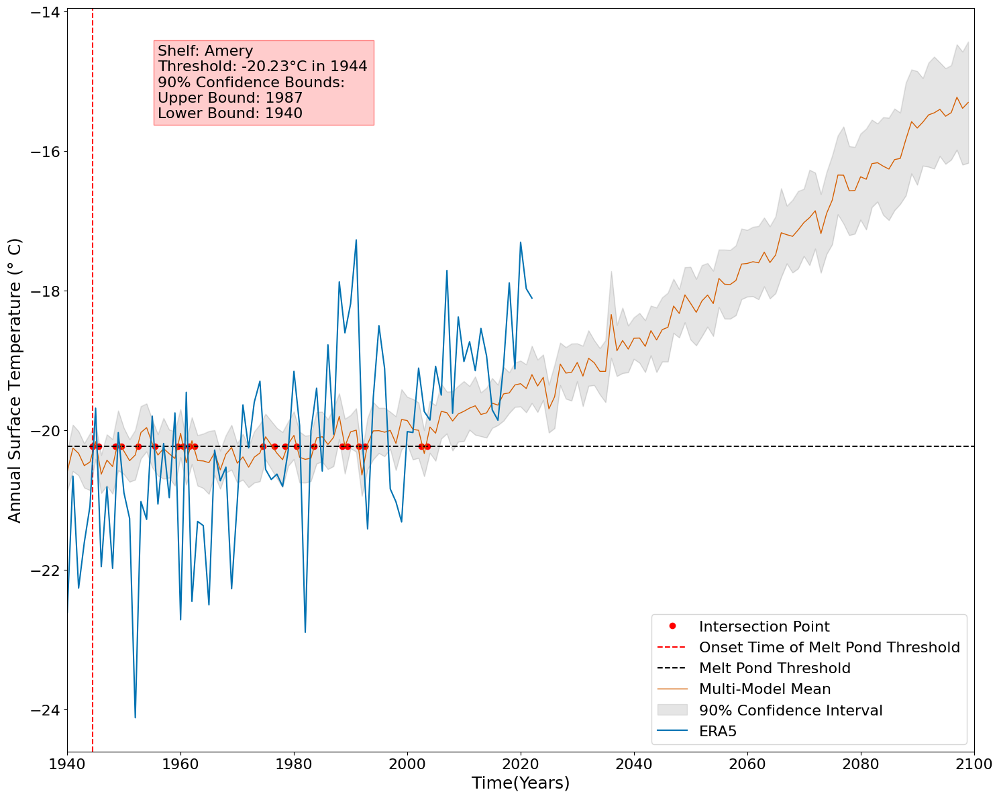

In [15]:
bias_analysis_monthly('Amery')

(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)


/tmp/ipykernel_14241/3548276871.py:119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)
(31, 160)


<Figure size 640x480 with 0 Axes>

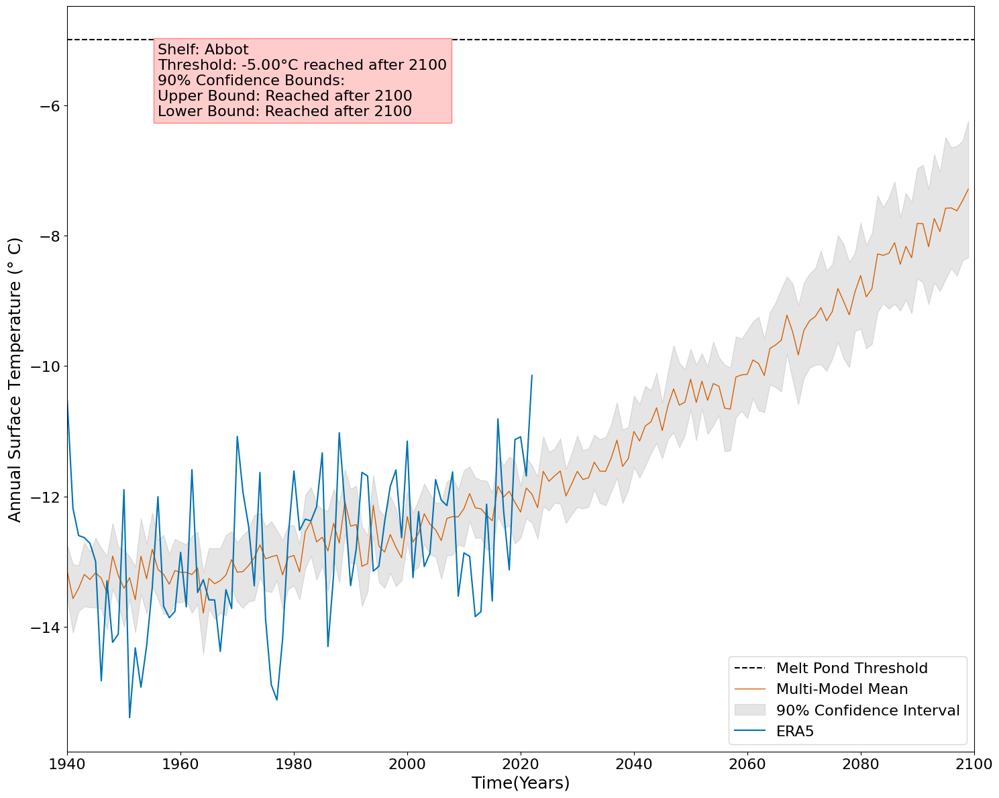

<Figure size 640x480 with 0 Axes>

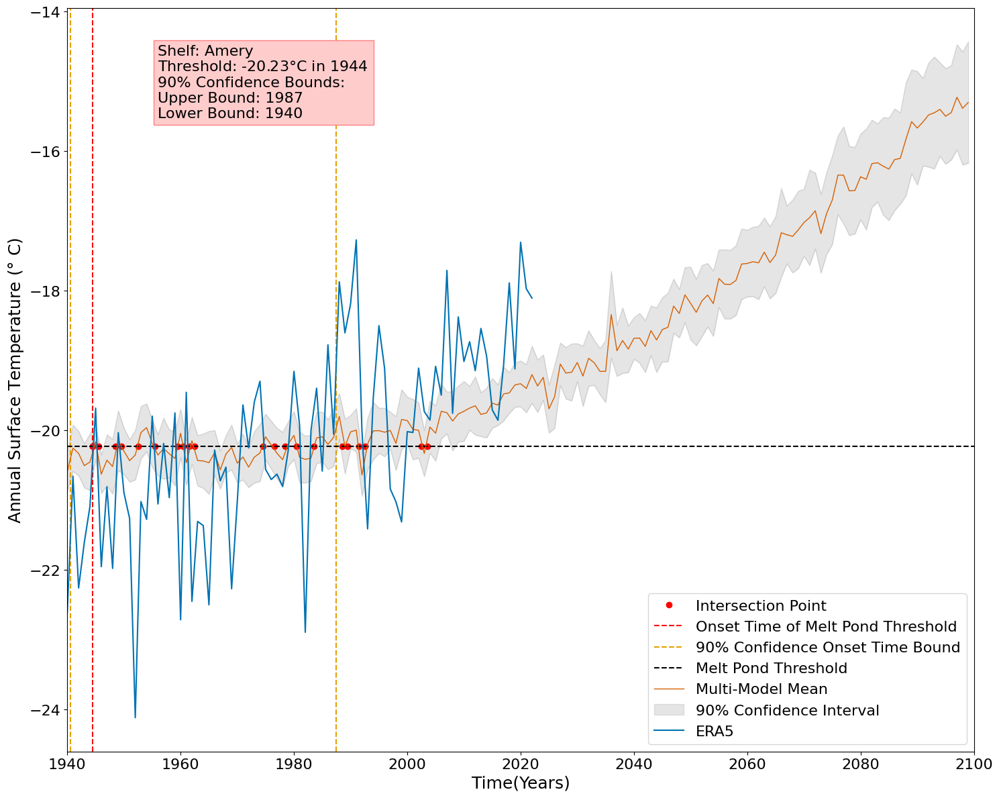

<Figure size 640x480 with 0 Axes>

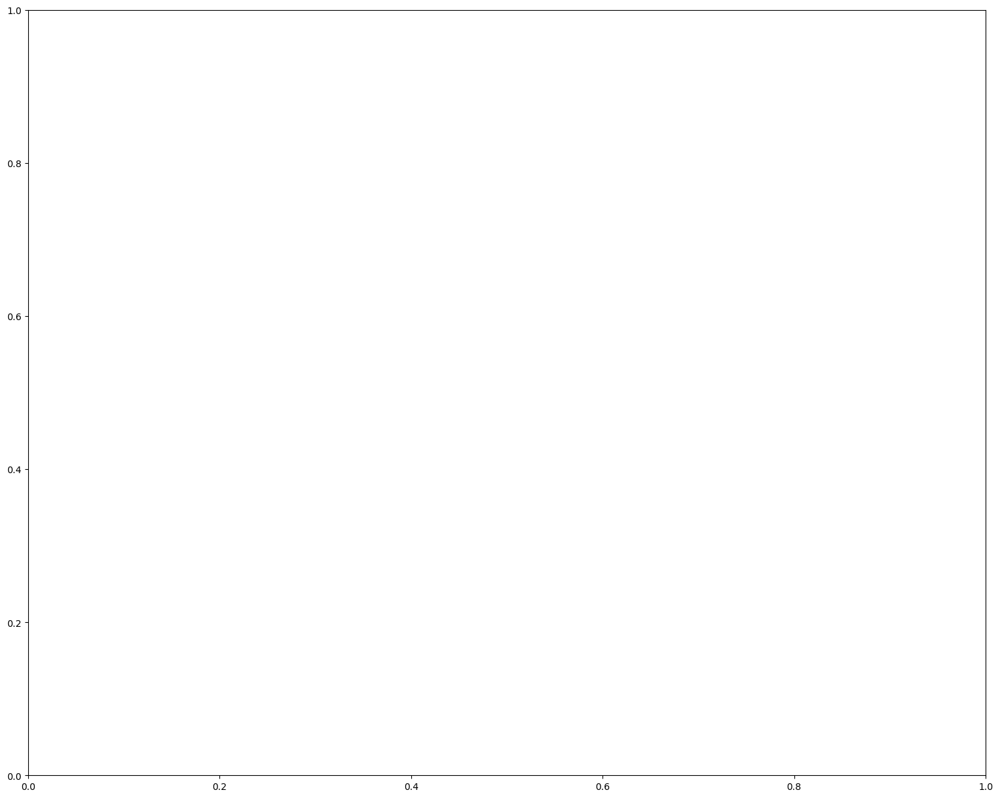

<Figure size 640x480 with 0 Axes>

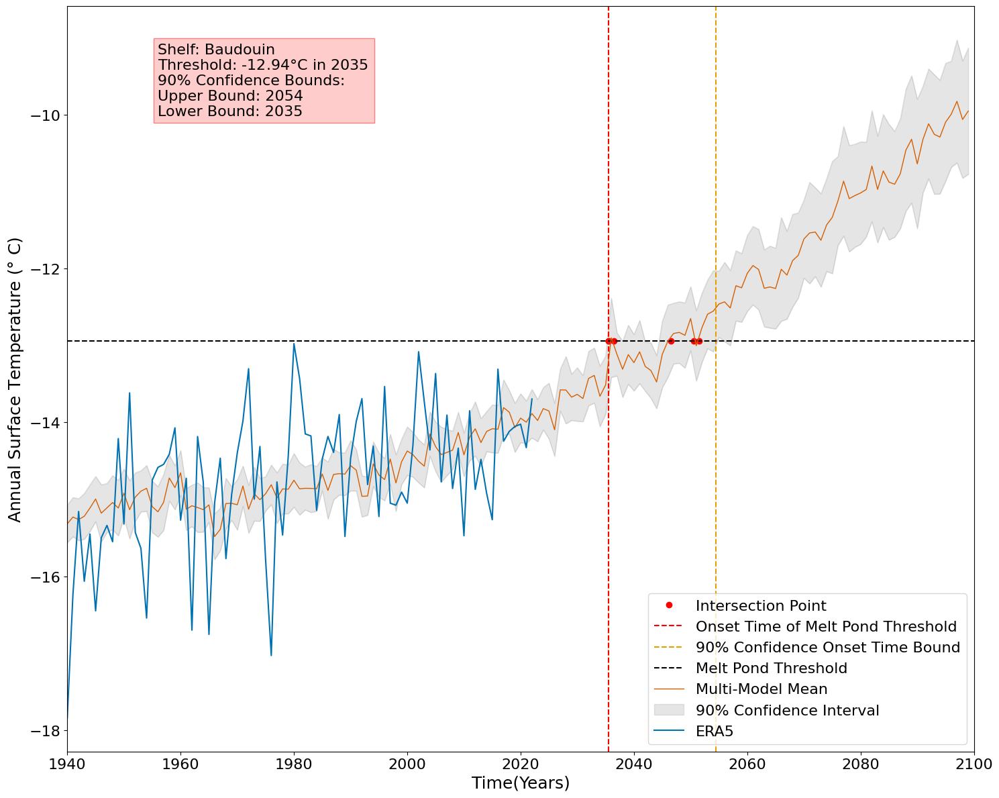

<Figure size 640x480 with 0 Axes>

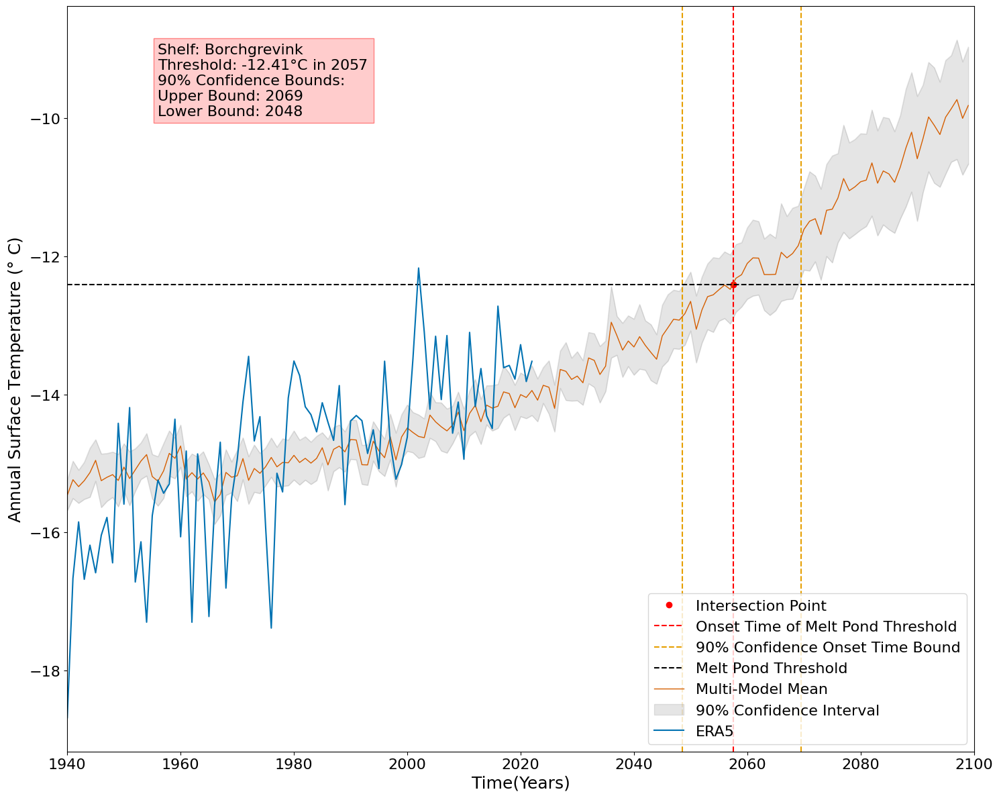

<Figure size 640x480 with 0 Axes>

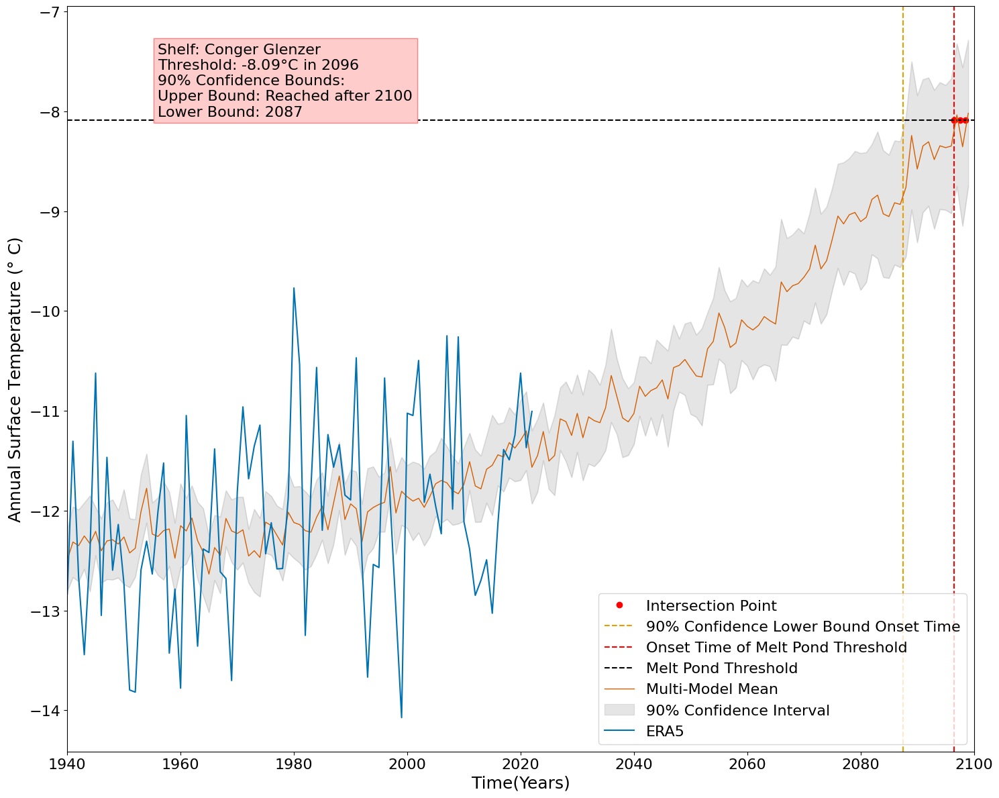

<Figure size 640x480 with 0 Axes>

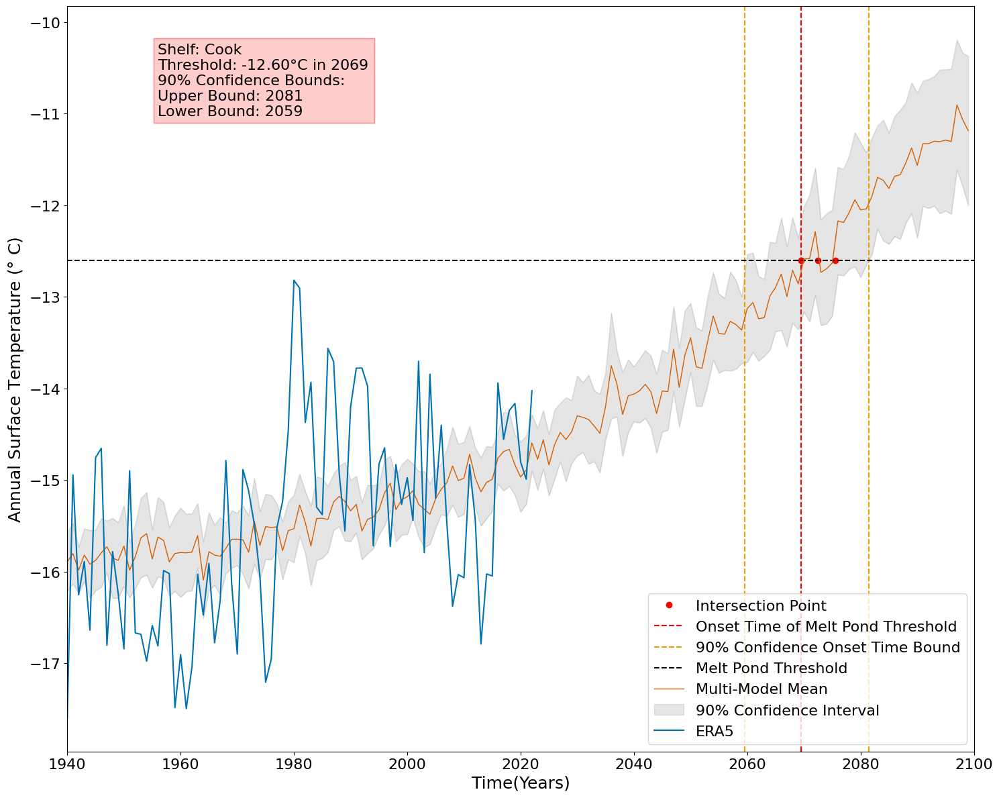

<Figure size 640x480 with 0 Axes>

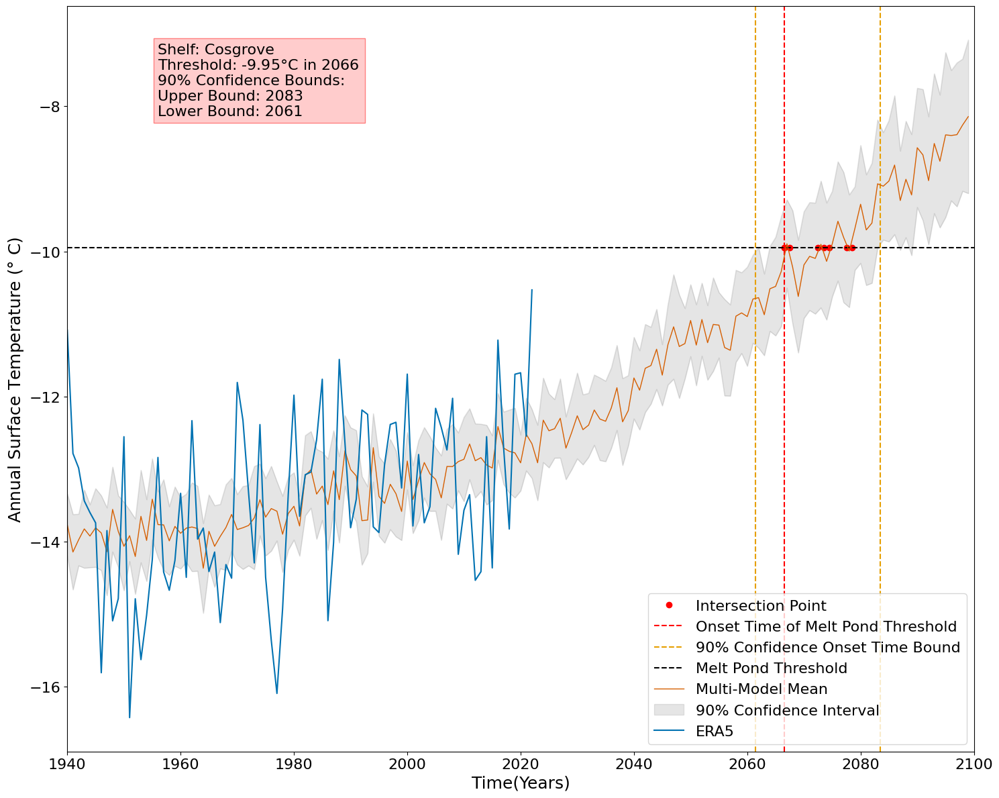

<Figure size 640x480 with 0 Axes>

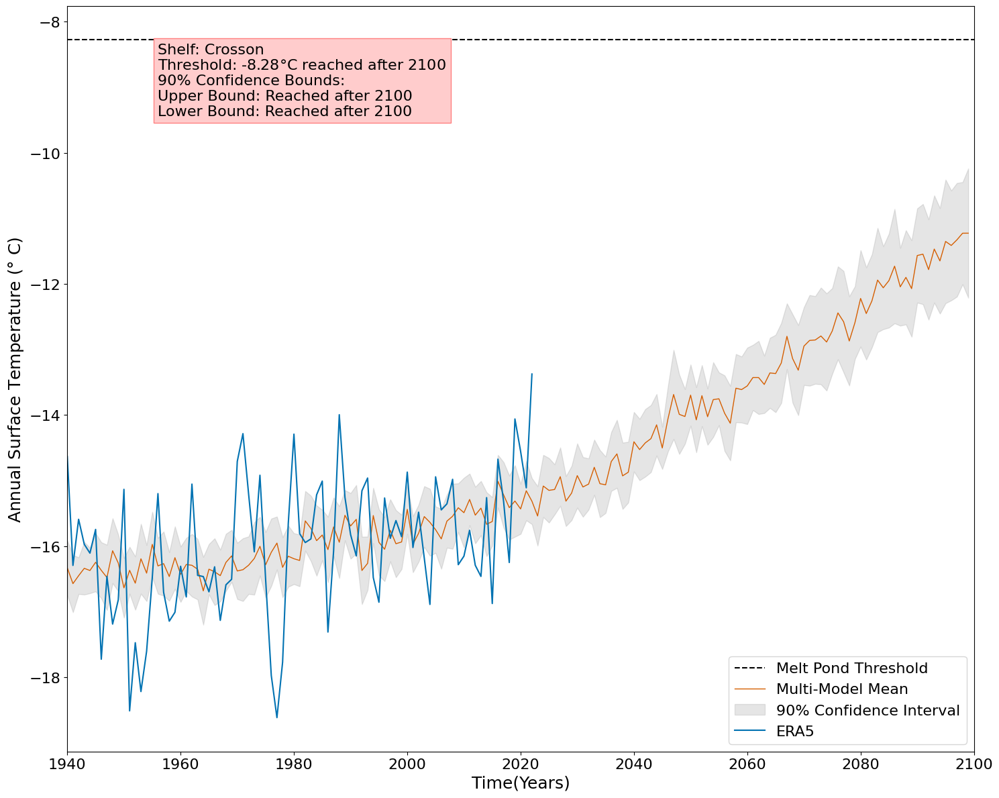

<Figure size 640x480 with 0 Axes>

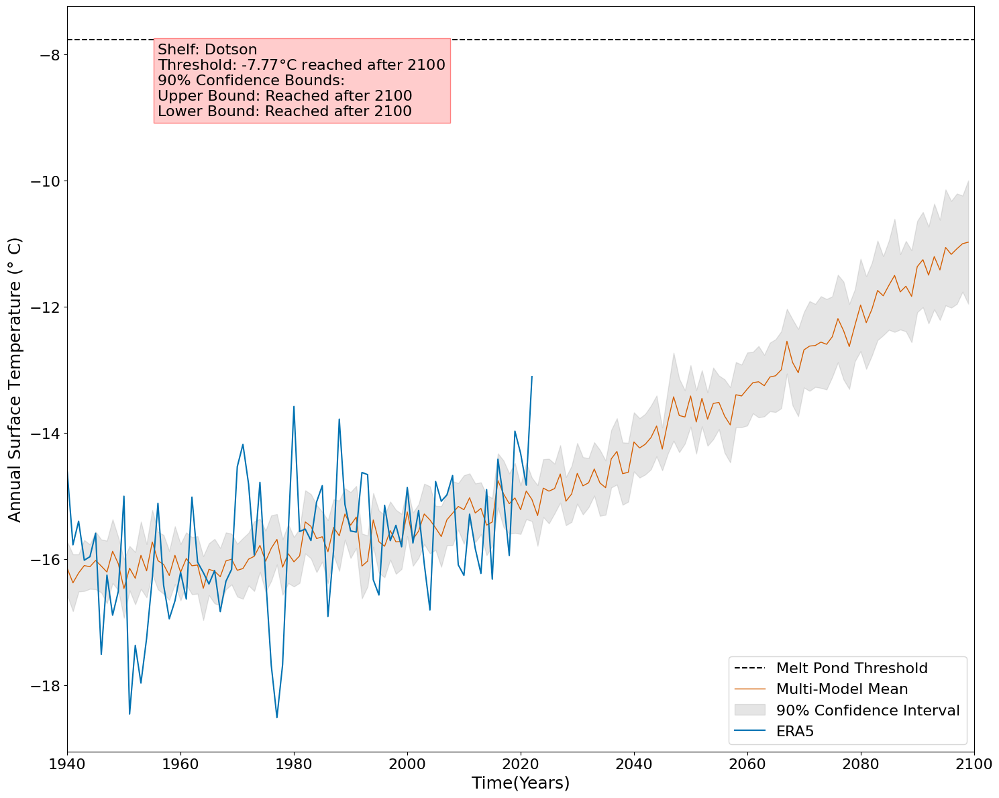

<Figure size 640x480 with 0 Axes>

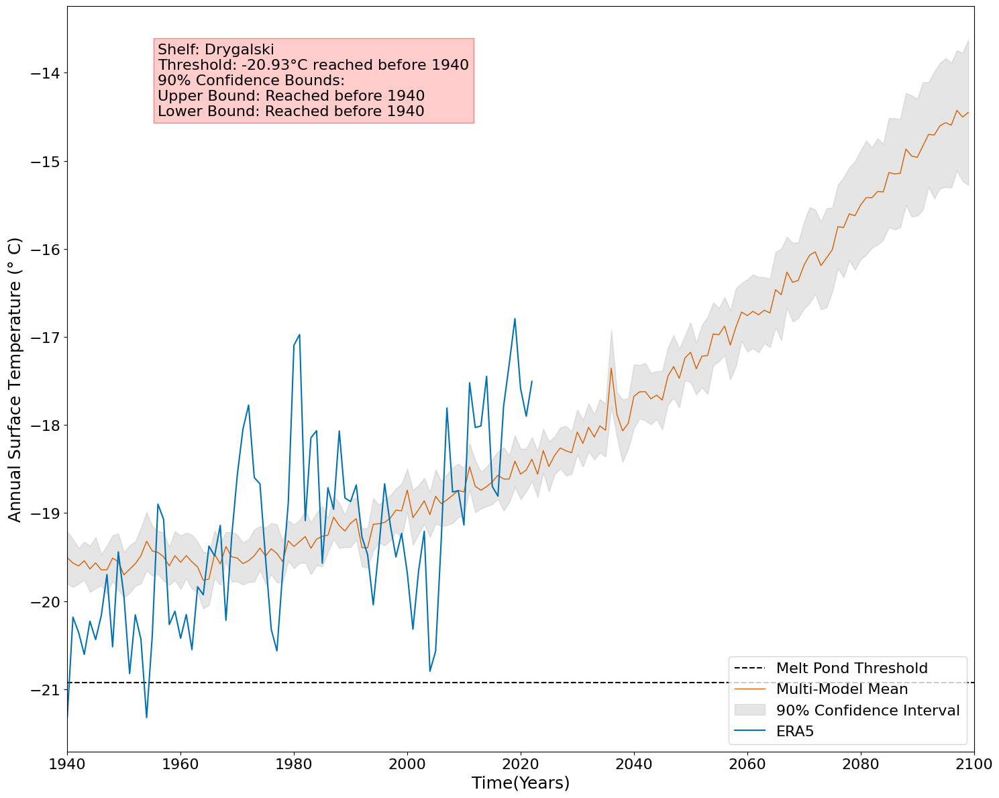

<Figure size 640x480 with 0 Axes>

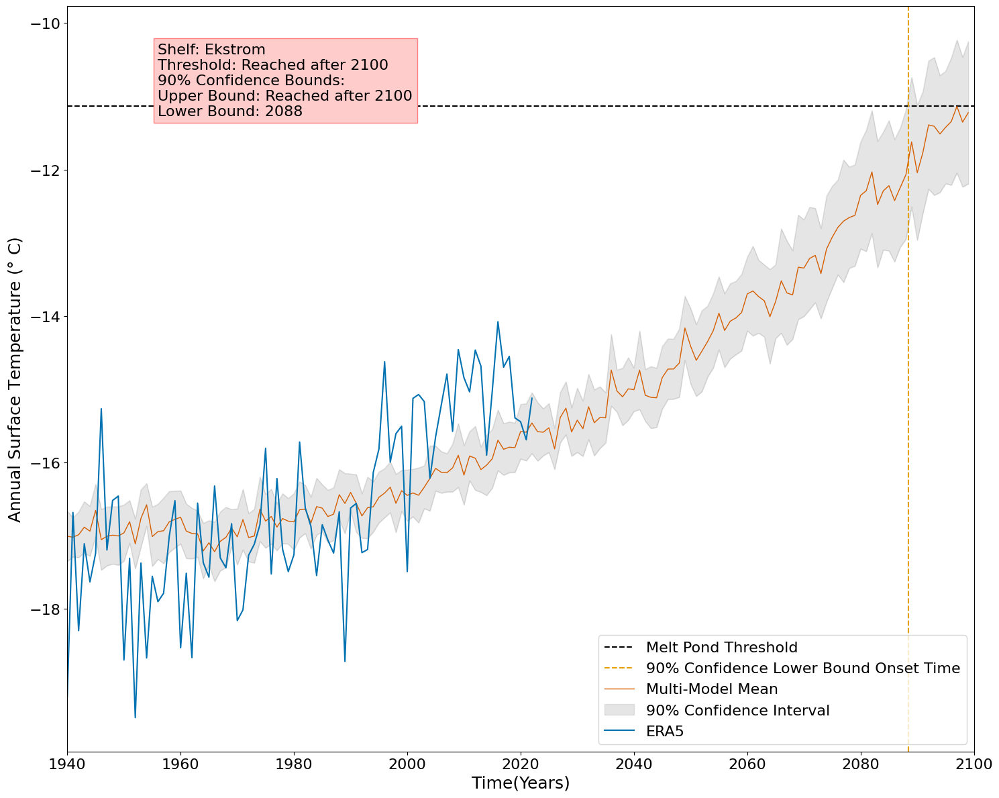

<Figure size 640x480 with 0 Axes>

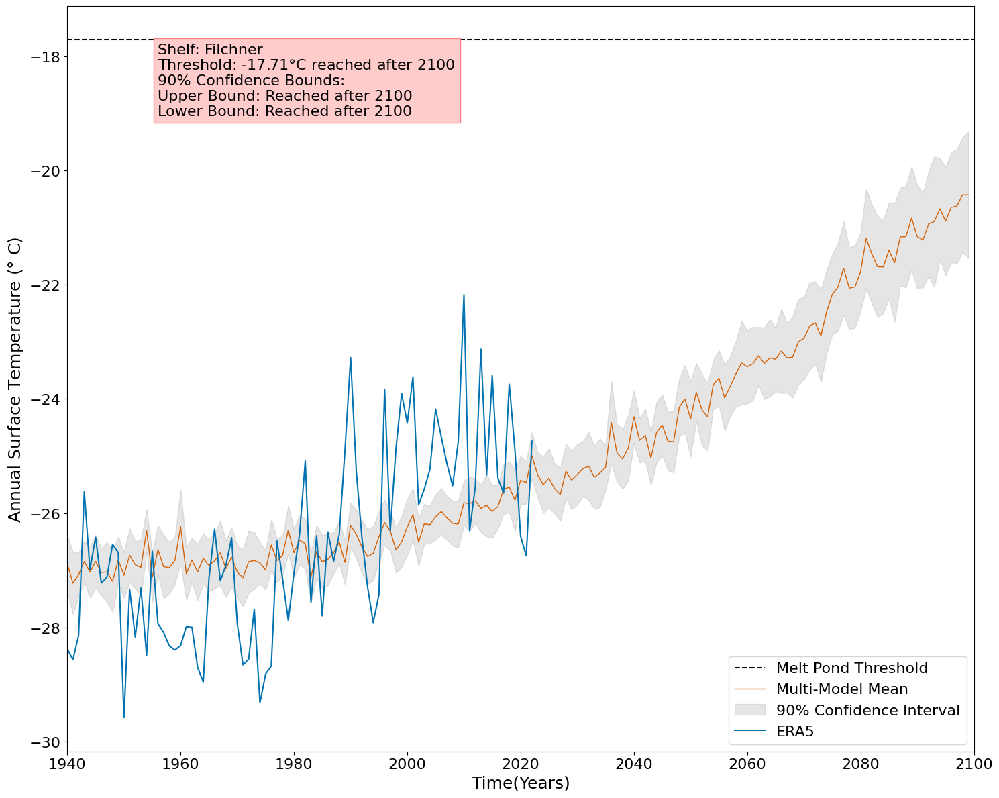

<Figure size 640x480 with 0 Axes>

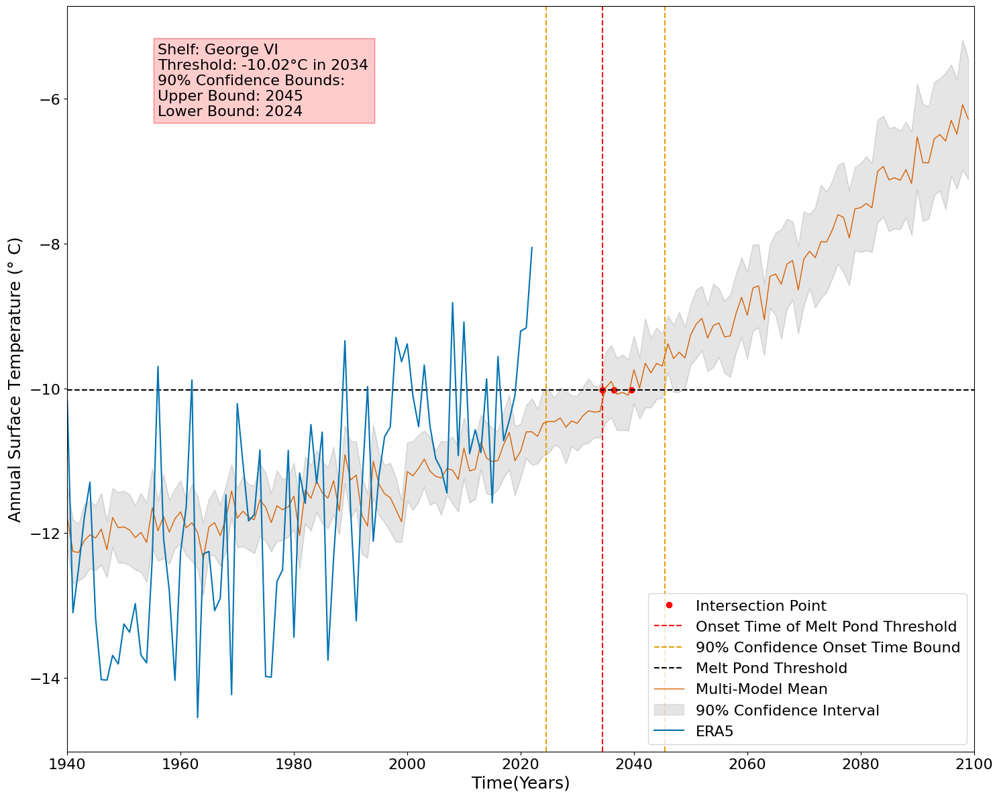

<Figure size 640x480 with 0 Axes>

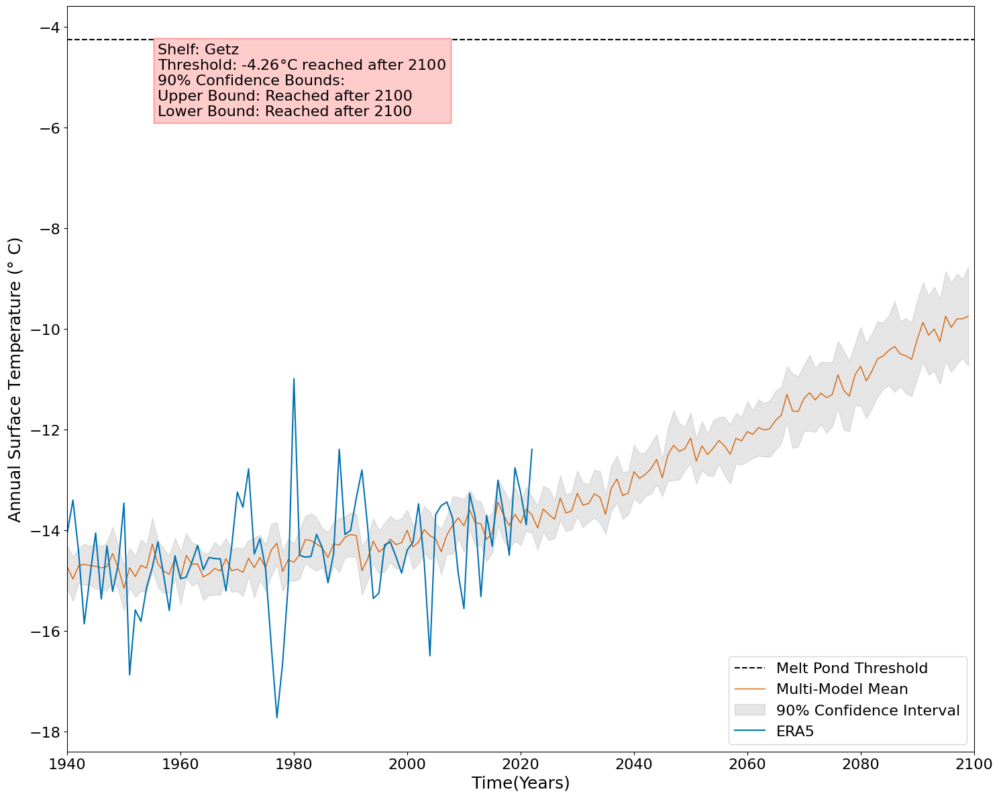

<Figure size 640x480 with 0 Axes>

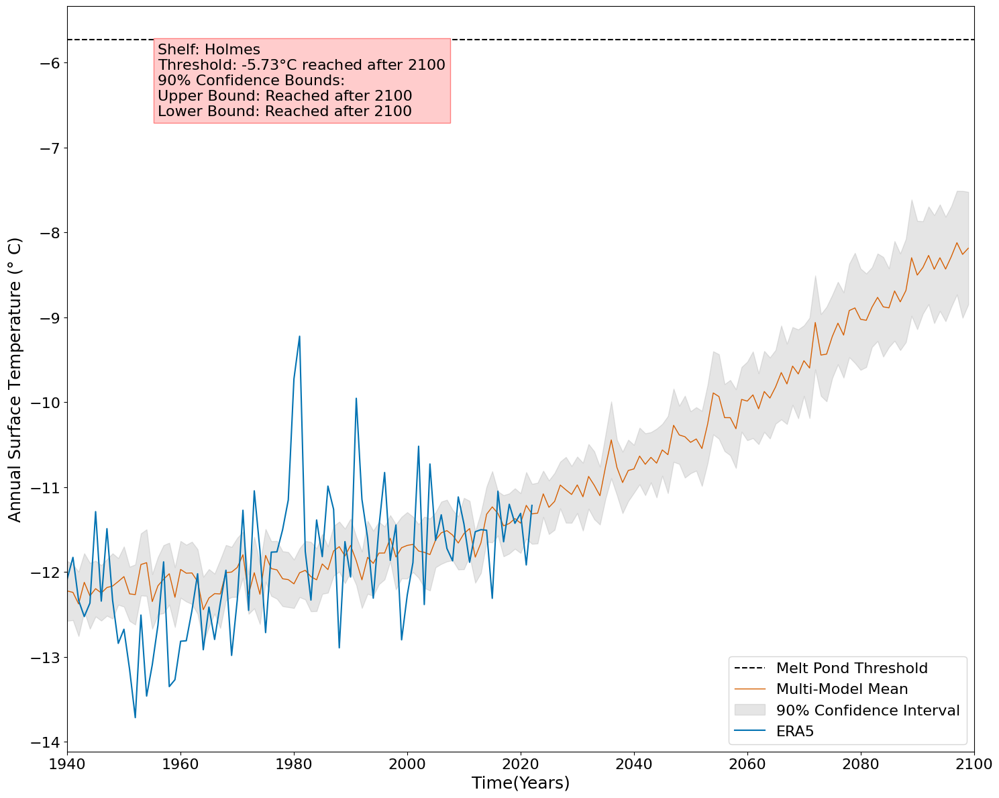

<Figure size 640x480 with 0 Axes>

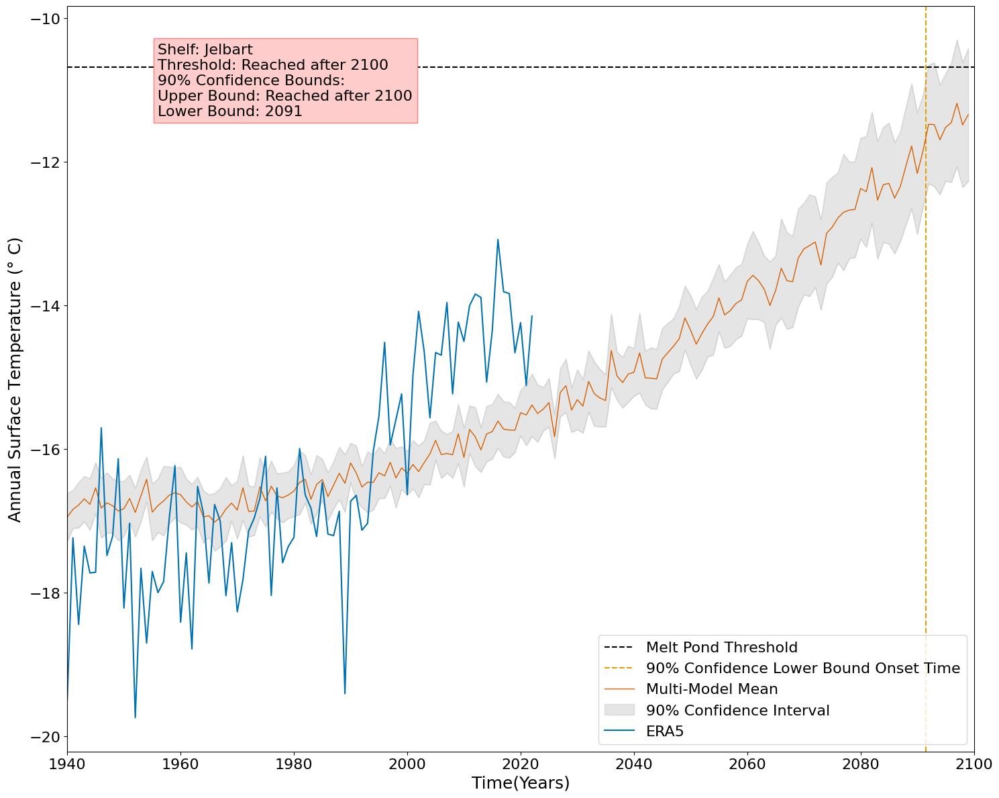

<Figure size 640x480 with 0 Axes>

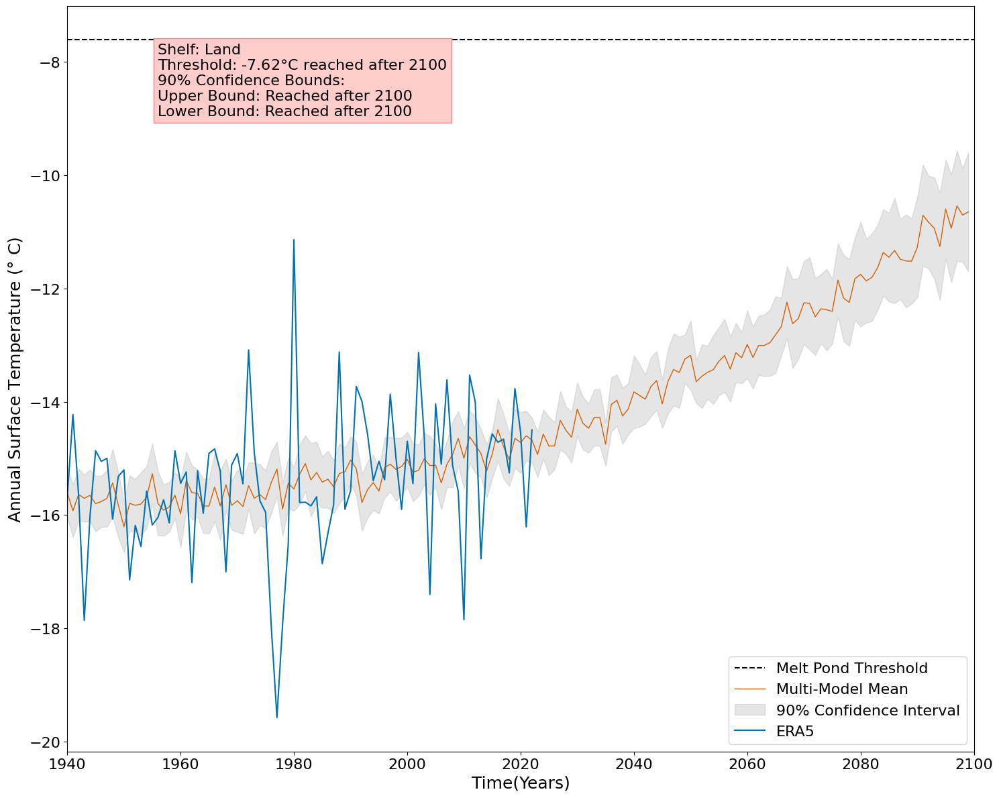

<Figure size 640x480 with 0 Axes>

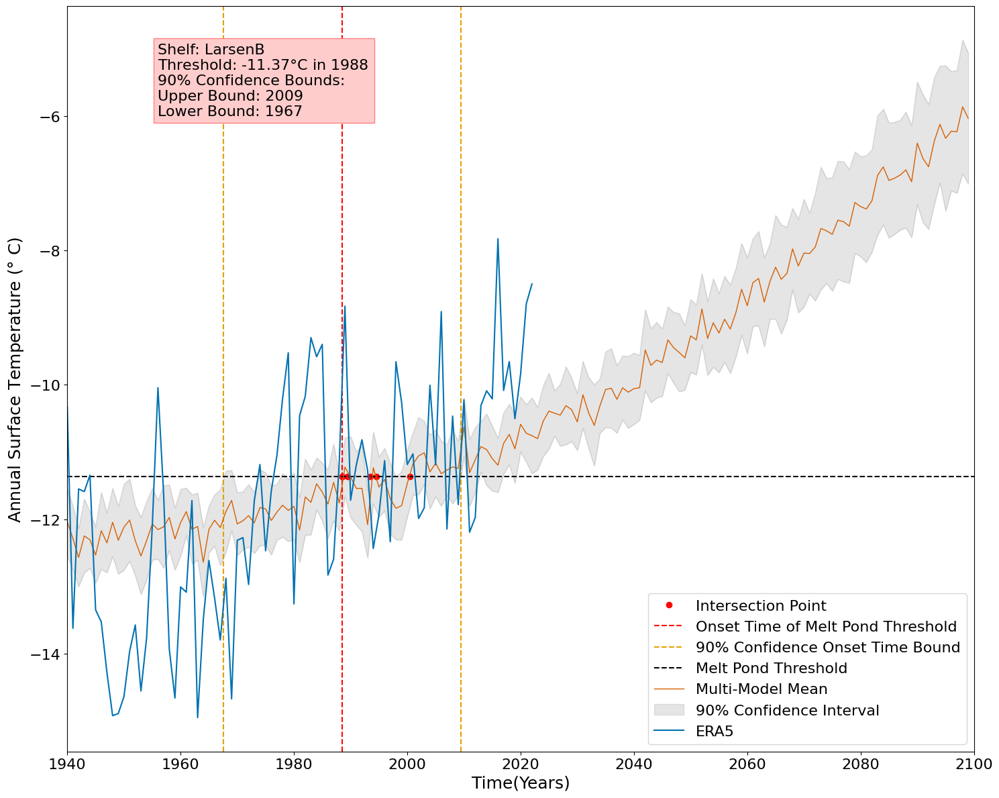

<Figure size 640x480 with 0 Axes>

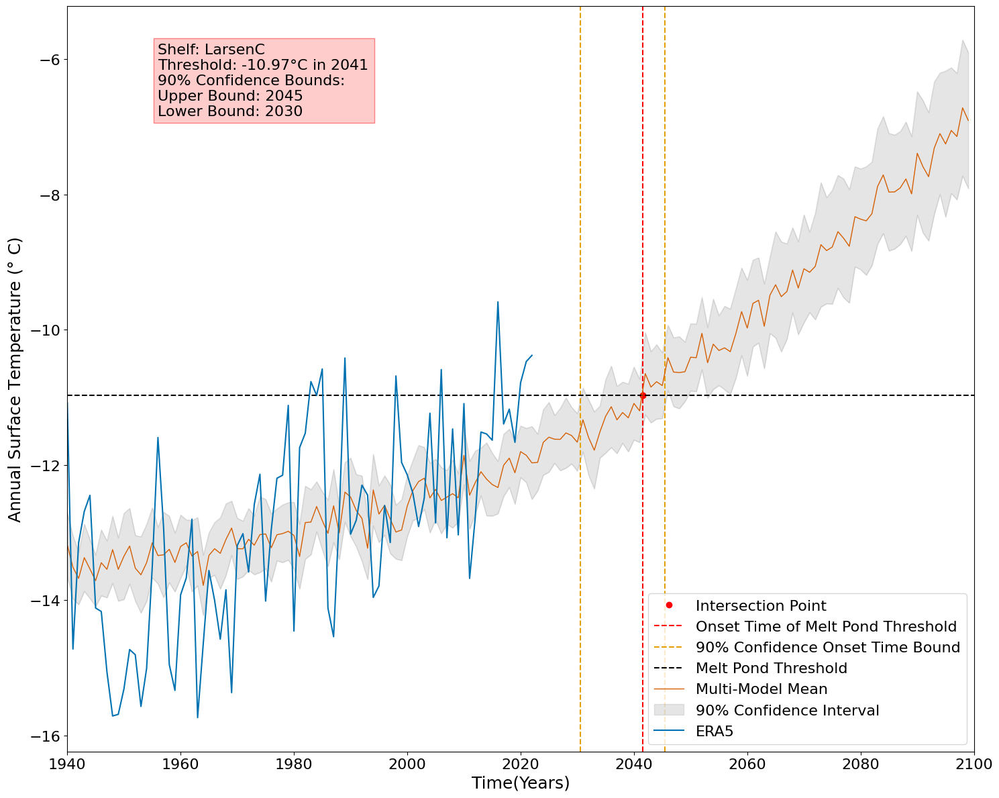

<Figure size 640x480 with 0 Axes>

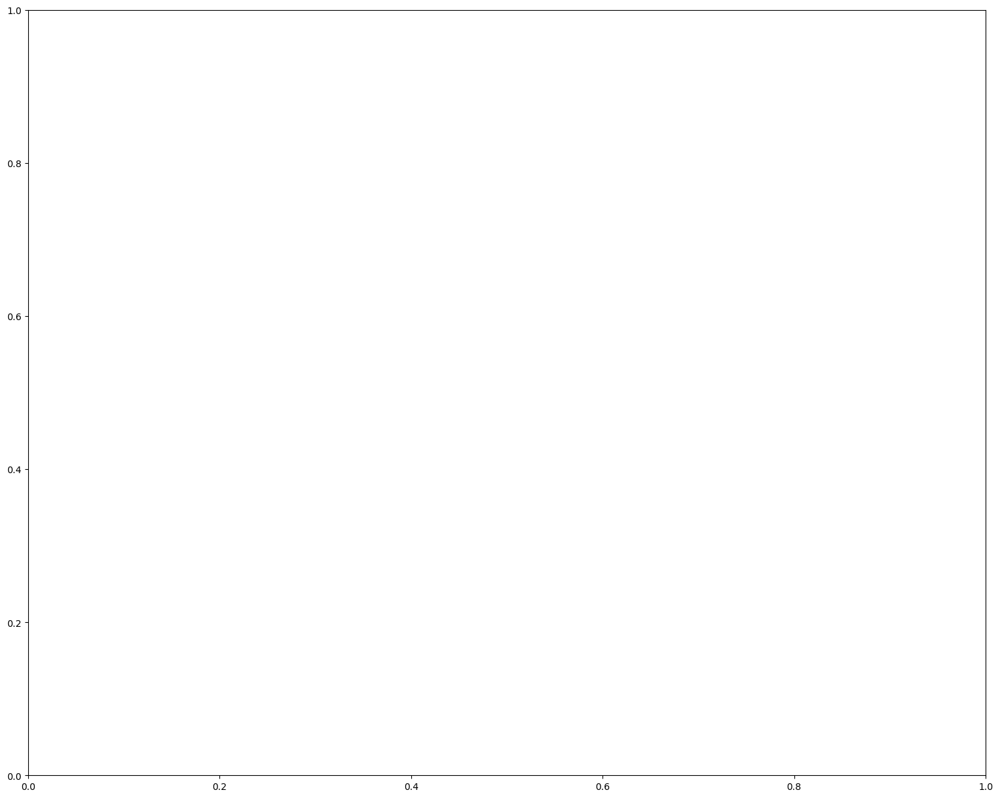

<Figure size 640x480 with 0 Axes>

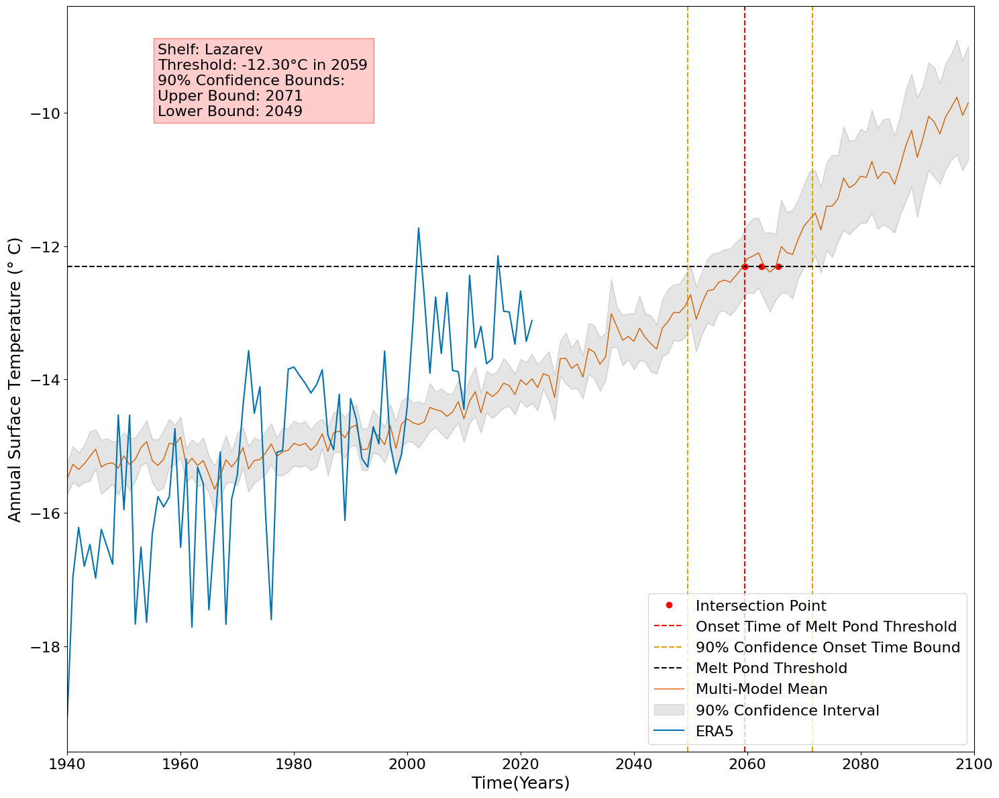

<Figure size 640x480 with 0 Axes>

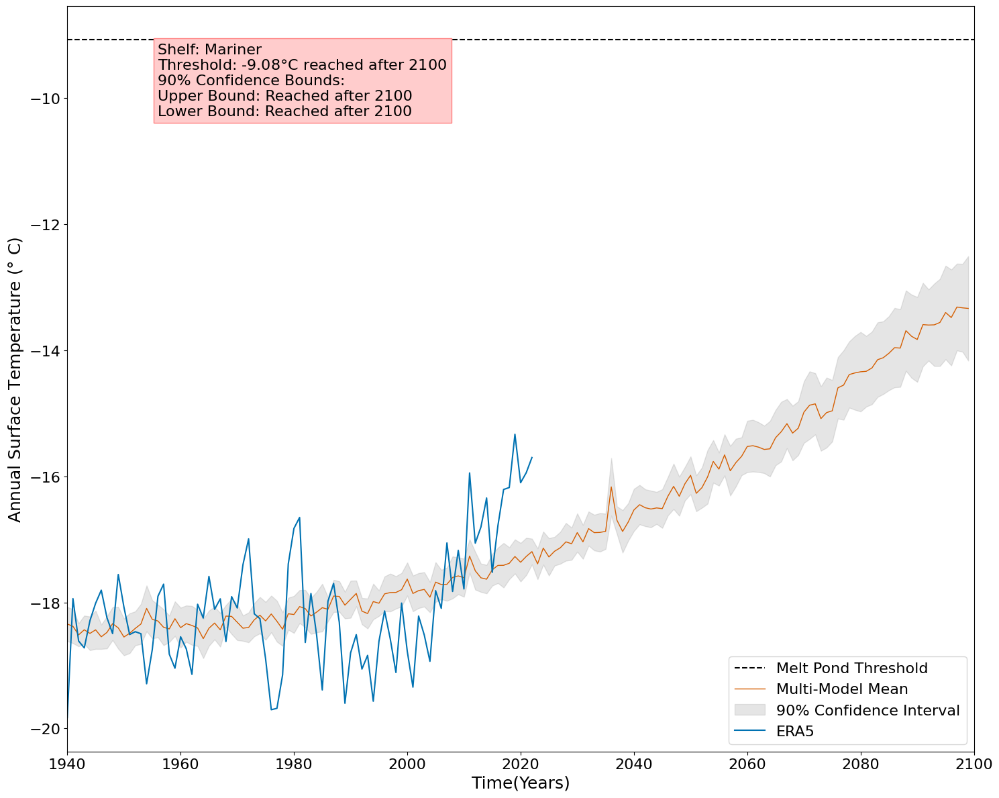

<Figure size 640x480 with 0 Axes>

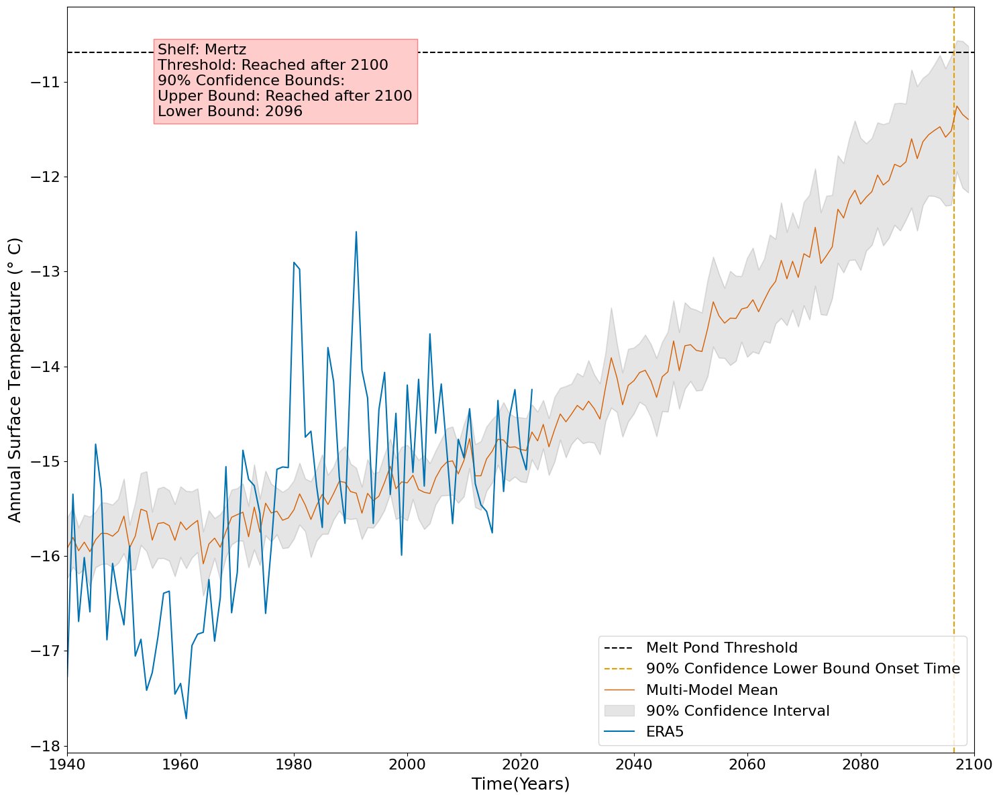

<Figure size 640x480 with 0 Axes>

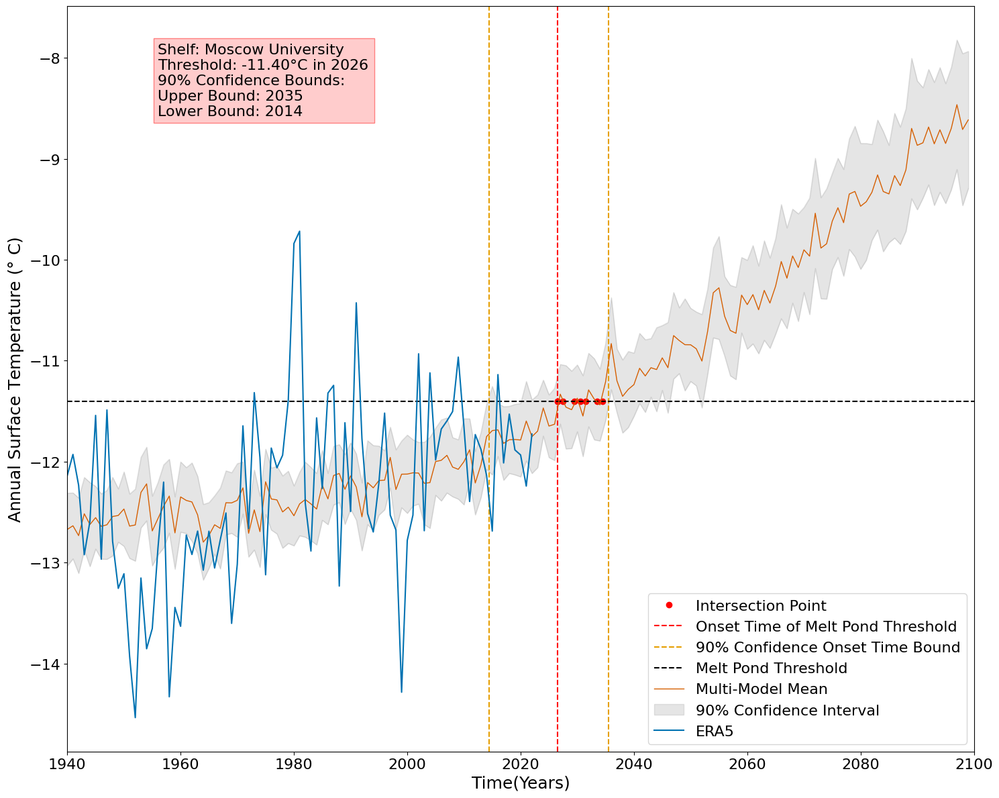

<Figure size 640x480 with 0 Axes>

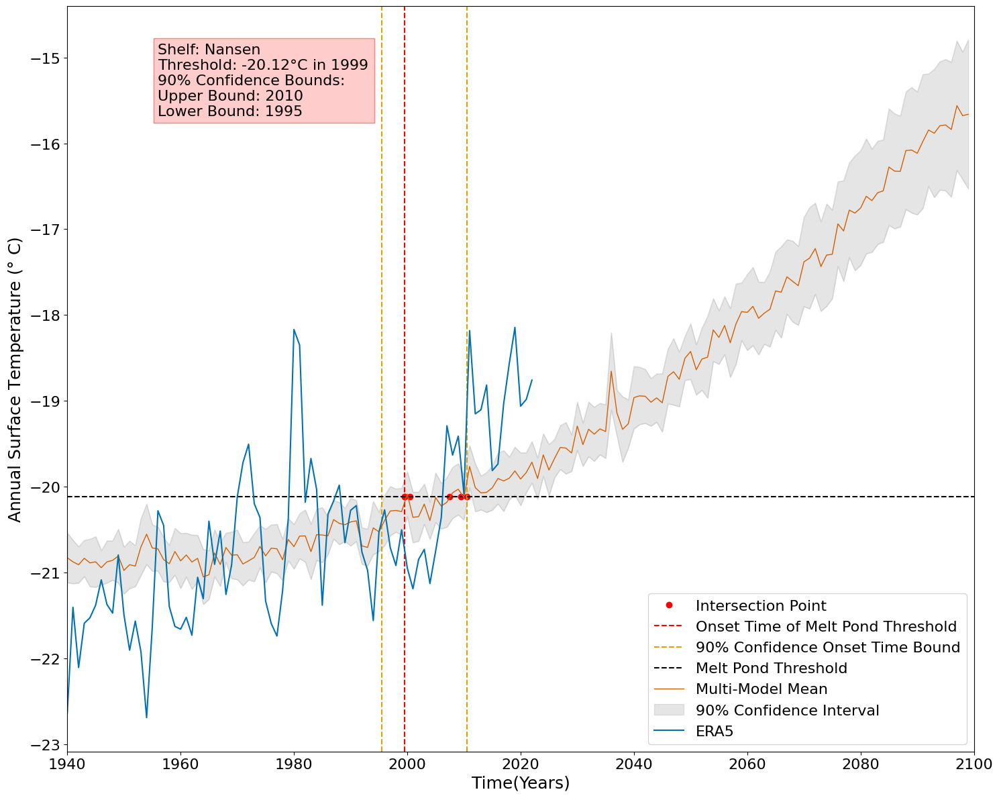

<Figure size 640x480 with 0 Axes>

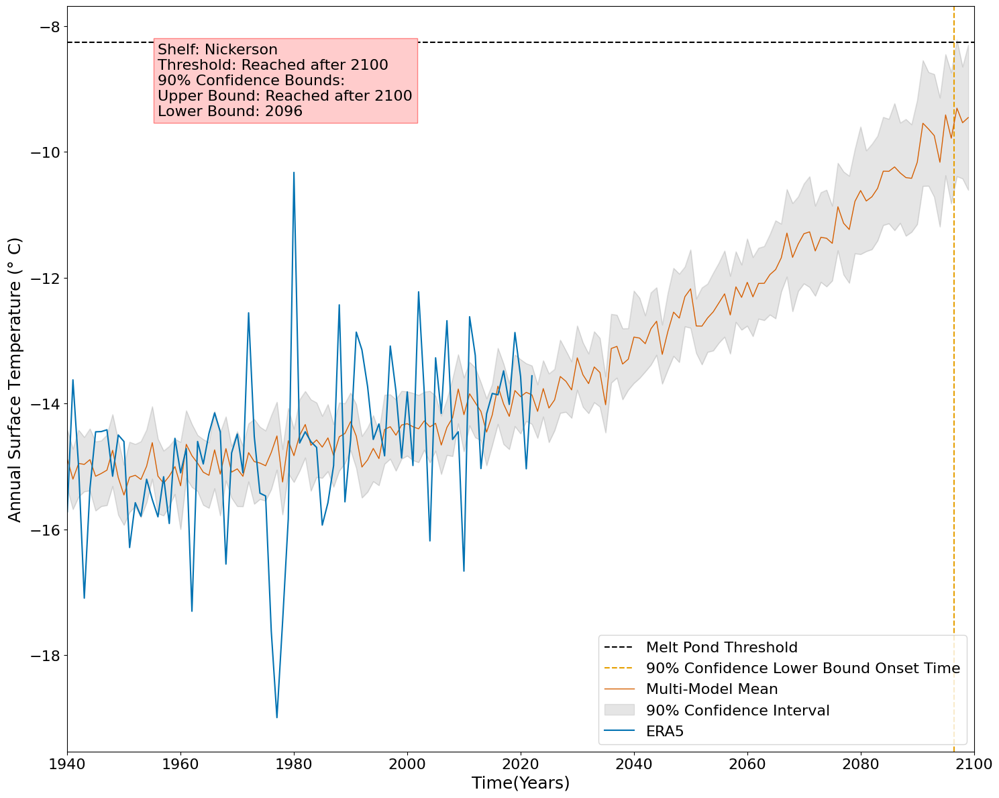

<Figure size 640x480 with 0 Axes>

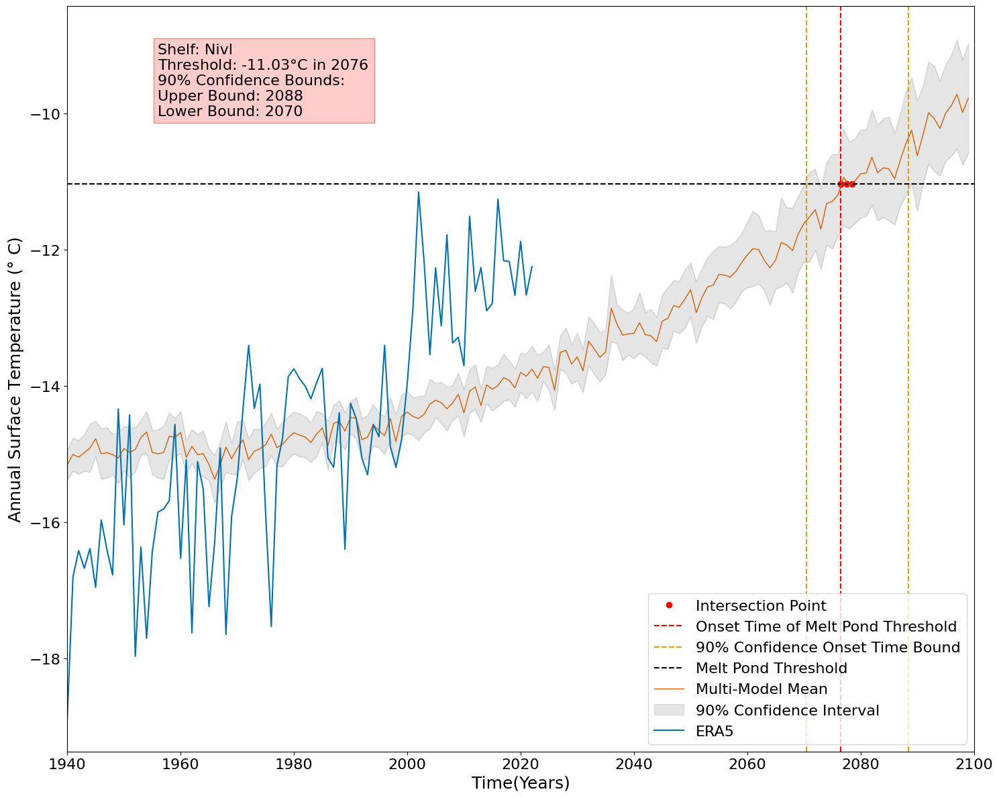

<Figure size 640x480 with 0 Axes>

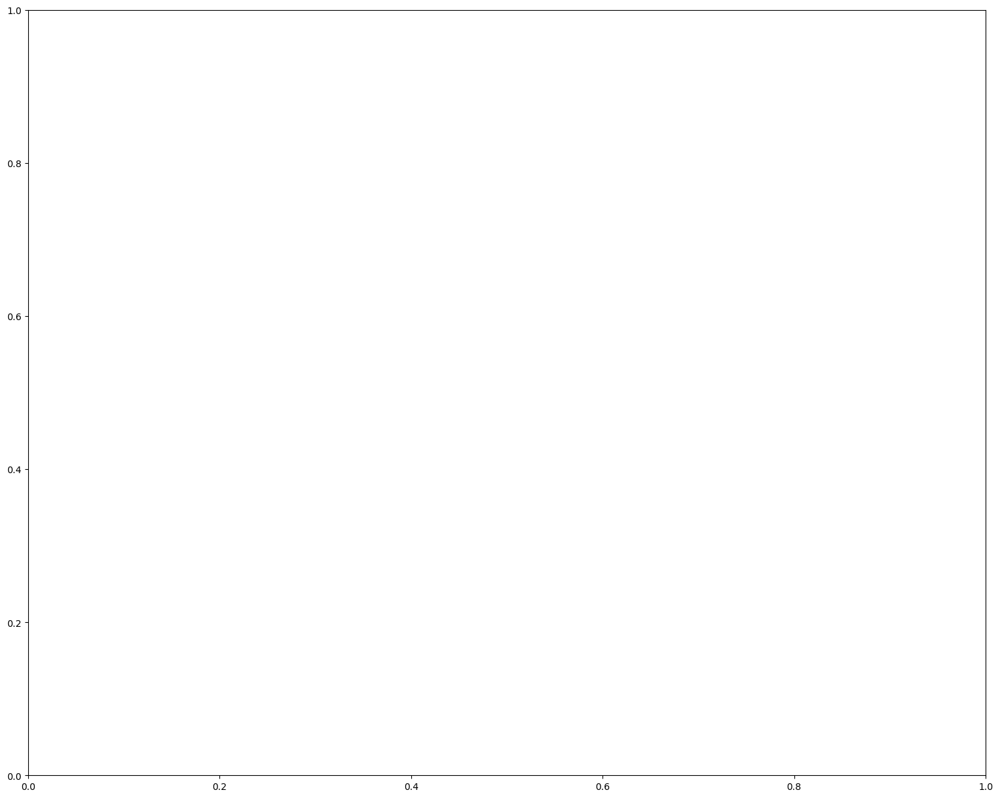

<Figure size 640x480 with 0 Axes>

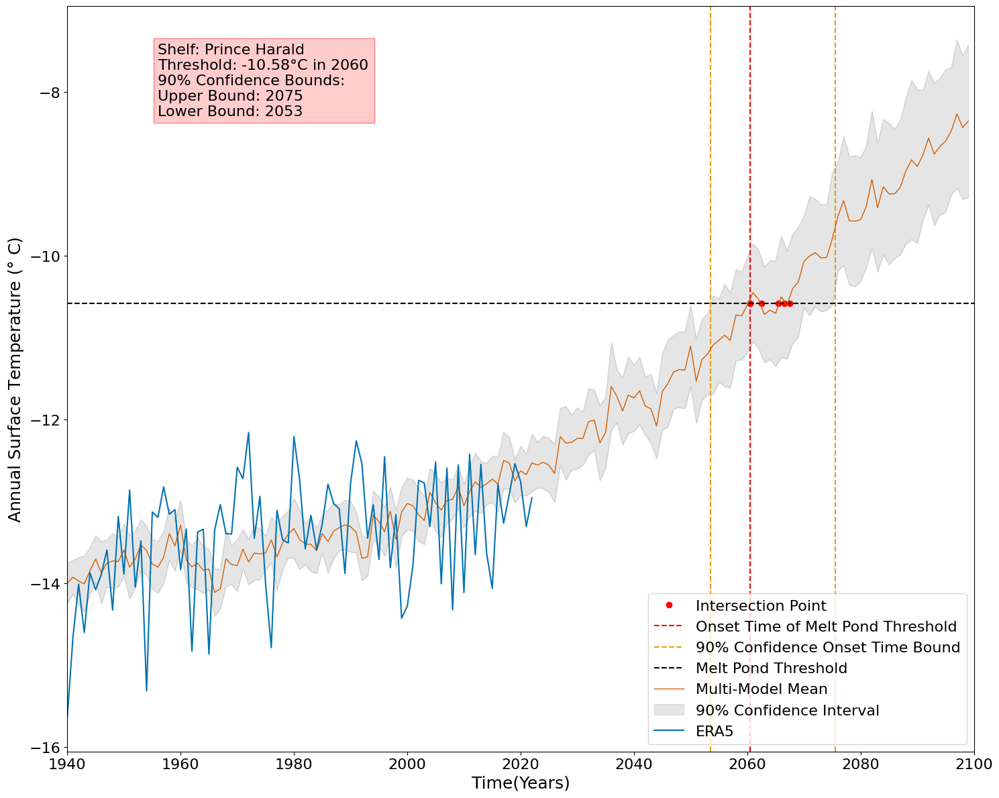

<Figure size 640x480 with 0 Axes>

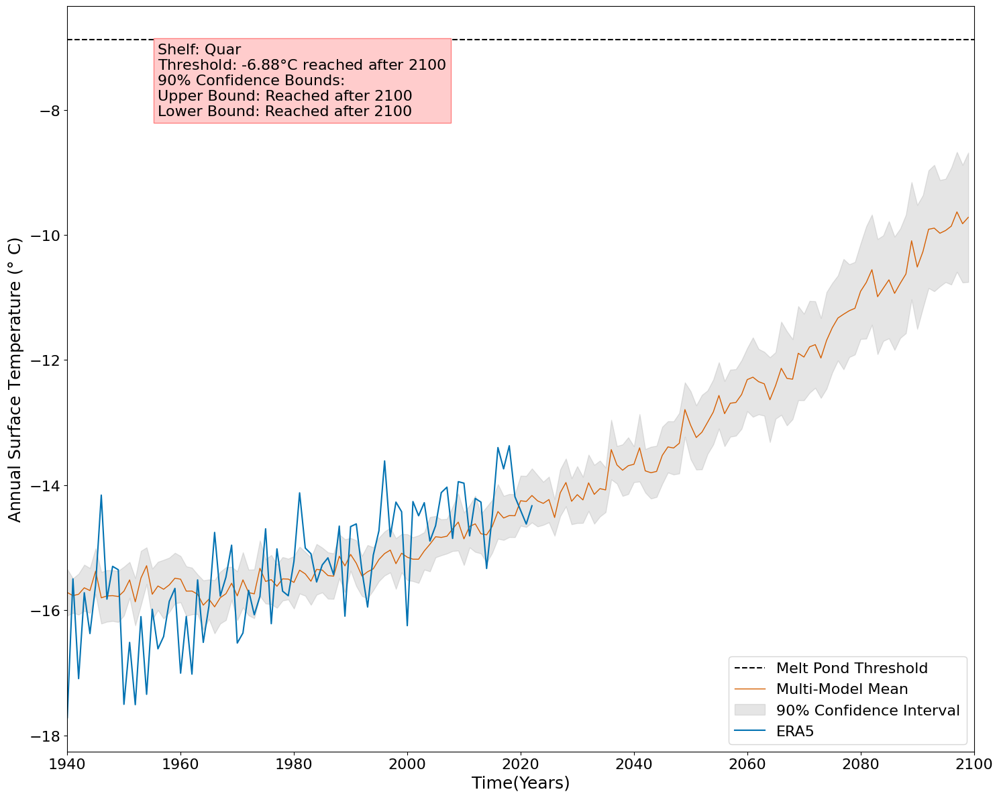

<Figure size 640x480 with 0 Axes>

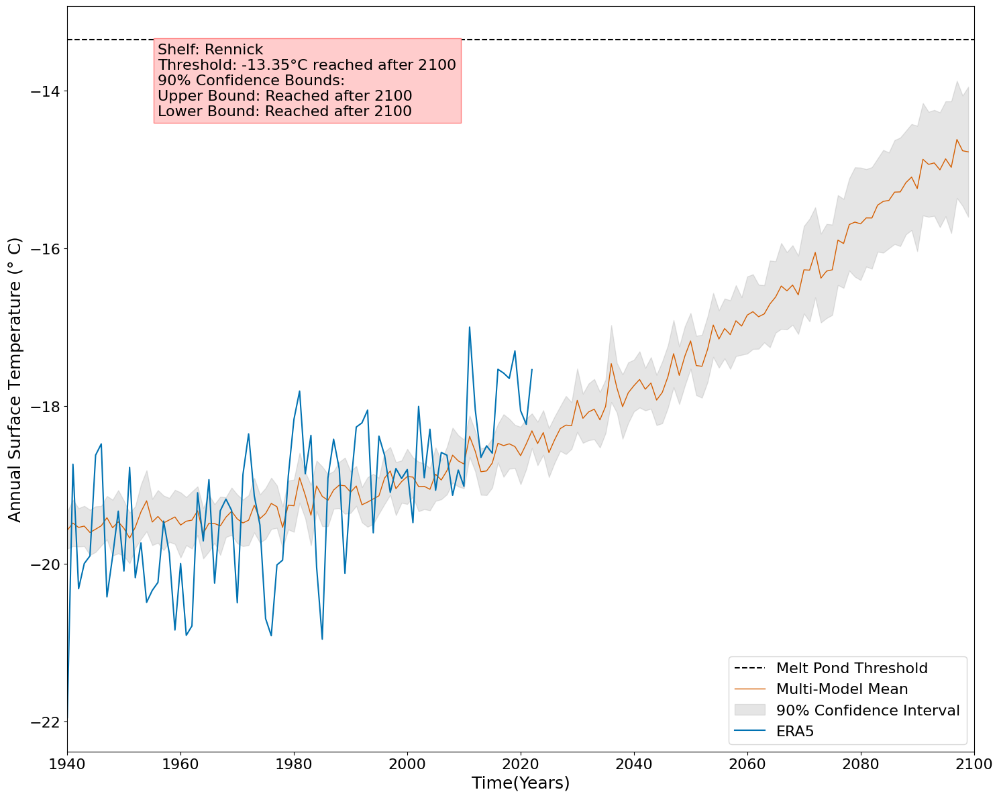

<Figure size 640x480 with 0 Axes>

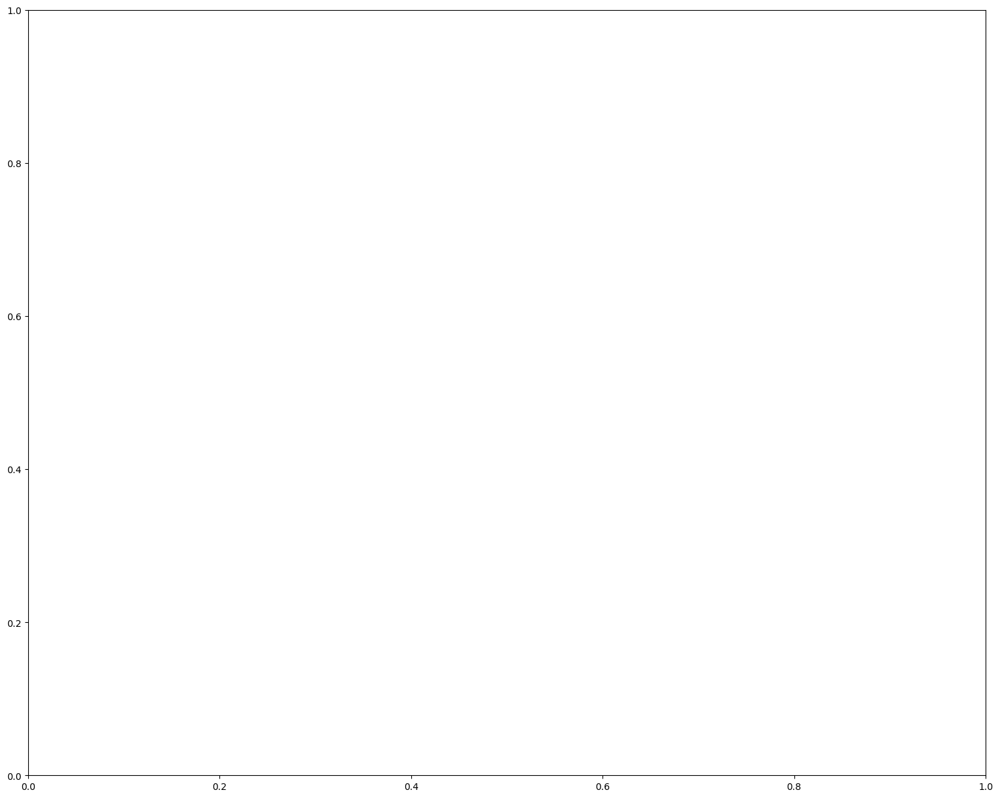

<Figure size 640x480 with 0 Axes>

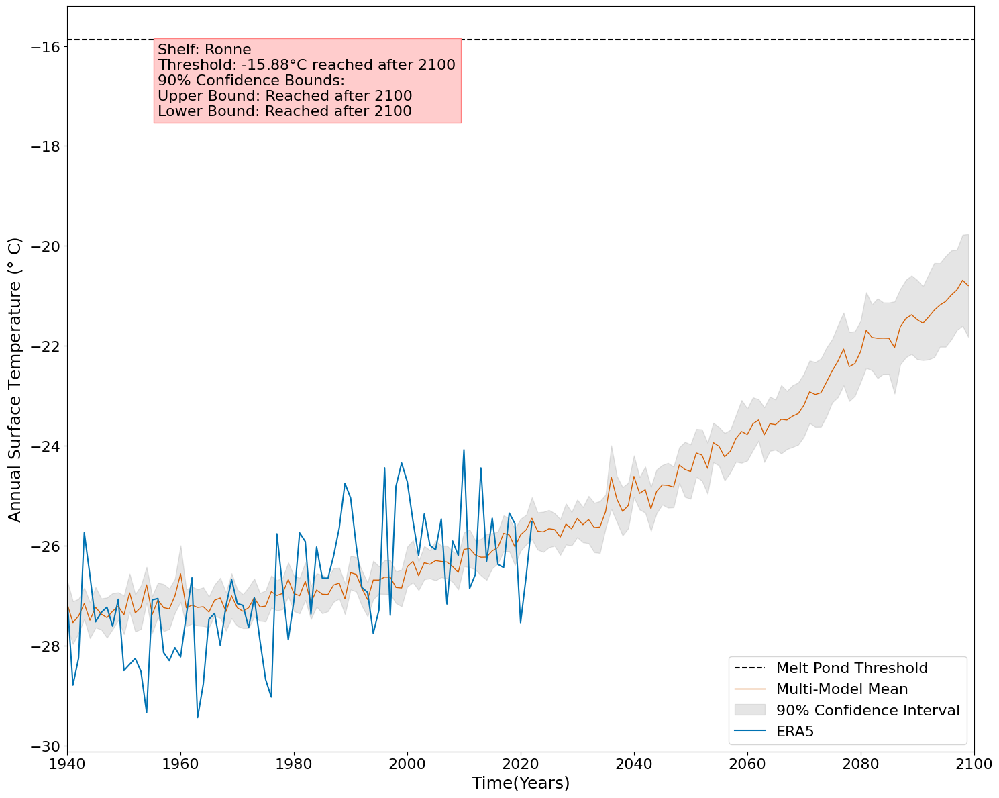

<Figure size 640x480 with 0 Axes>

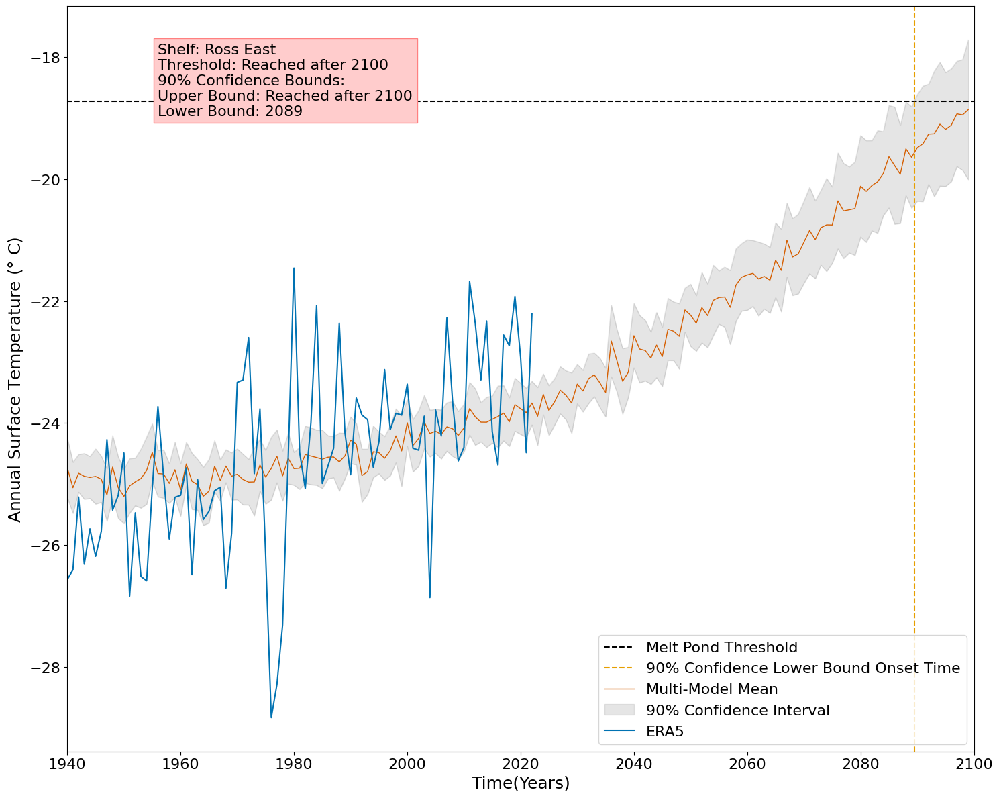

<Figure size 640x480 with 0 Axes>

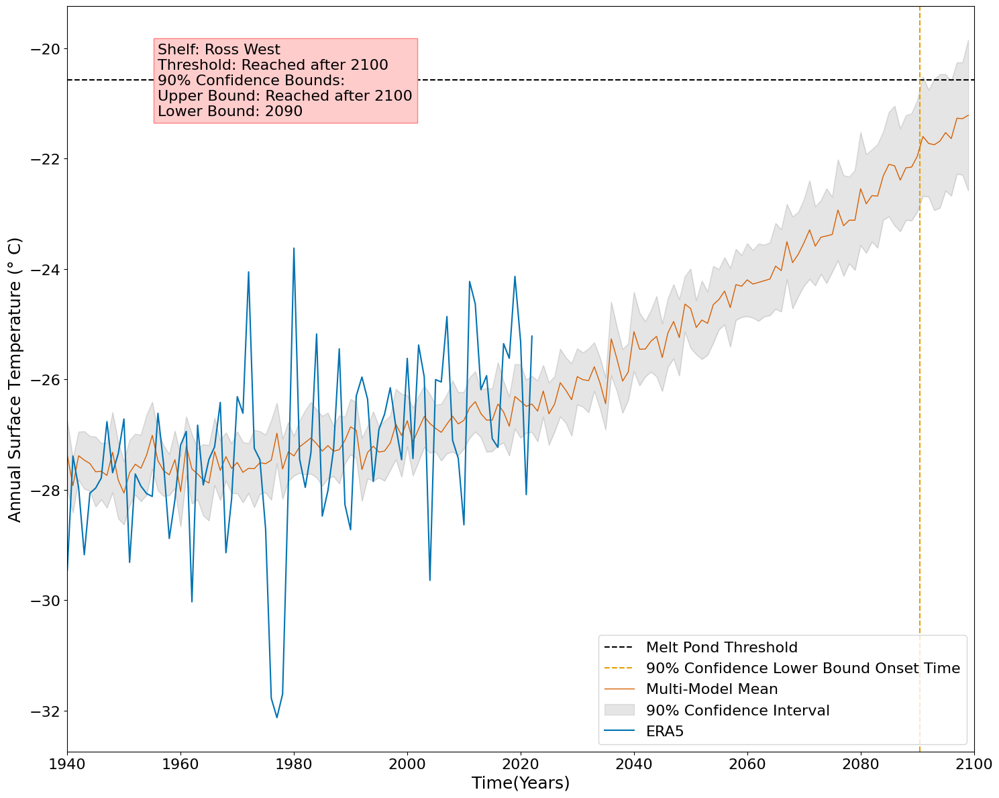

<Figure size 640x480 with 0 Axes>

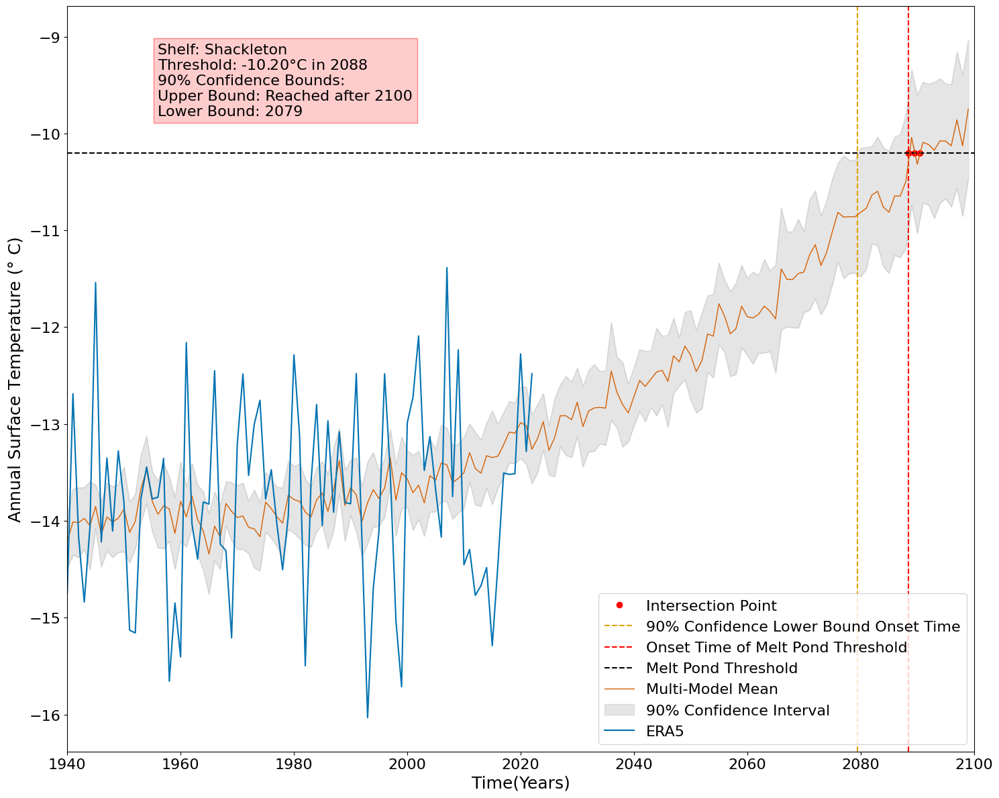

<Figure size 640x480 with 0 Axes>

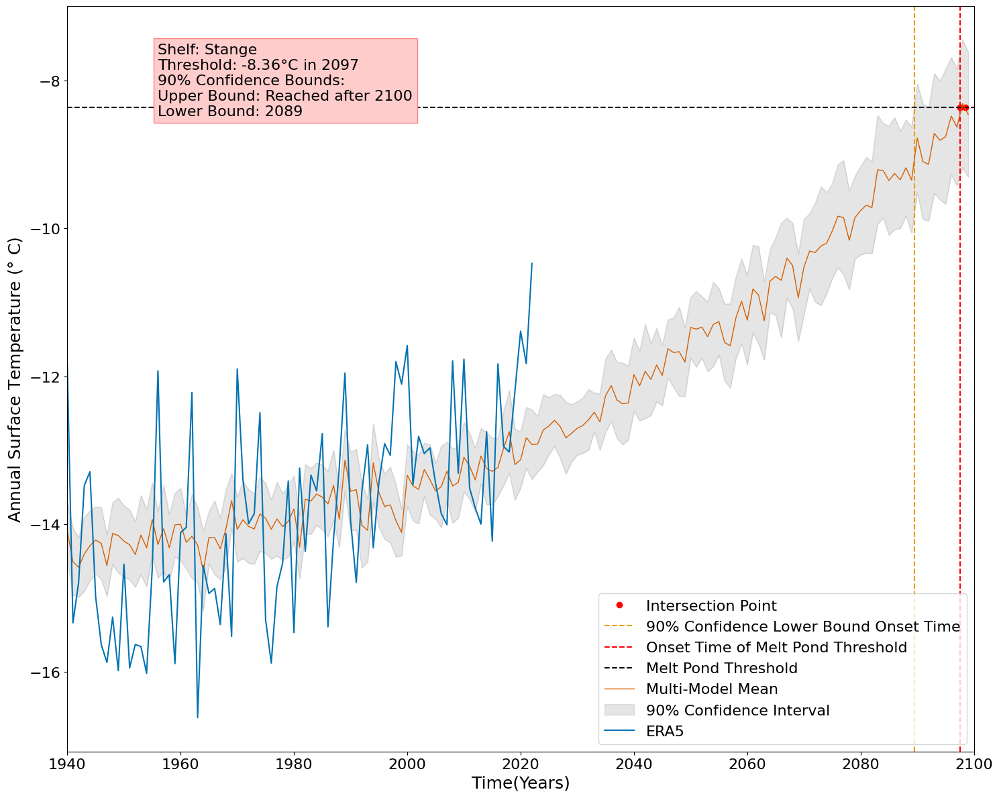

<Figure size 640x480 with 0 Axes>

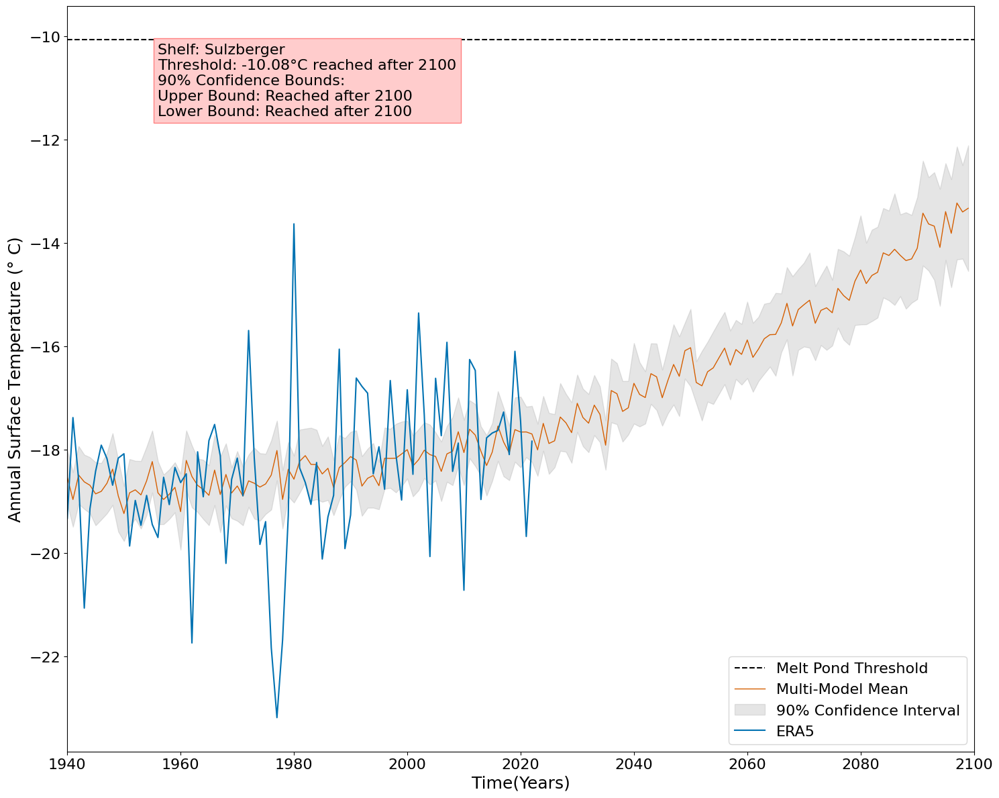

<Figure size 640x480 with 0 Axes>

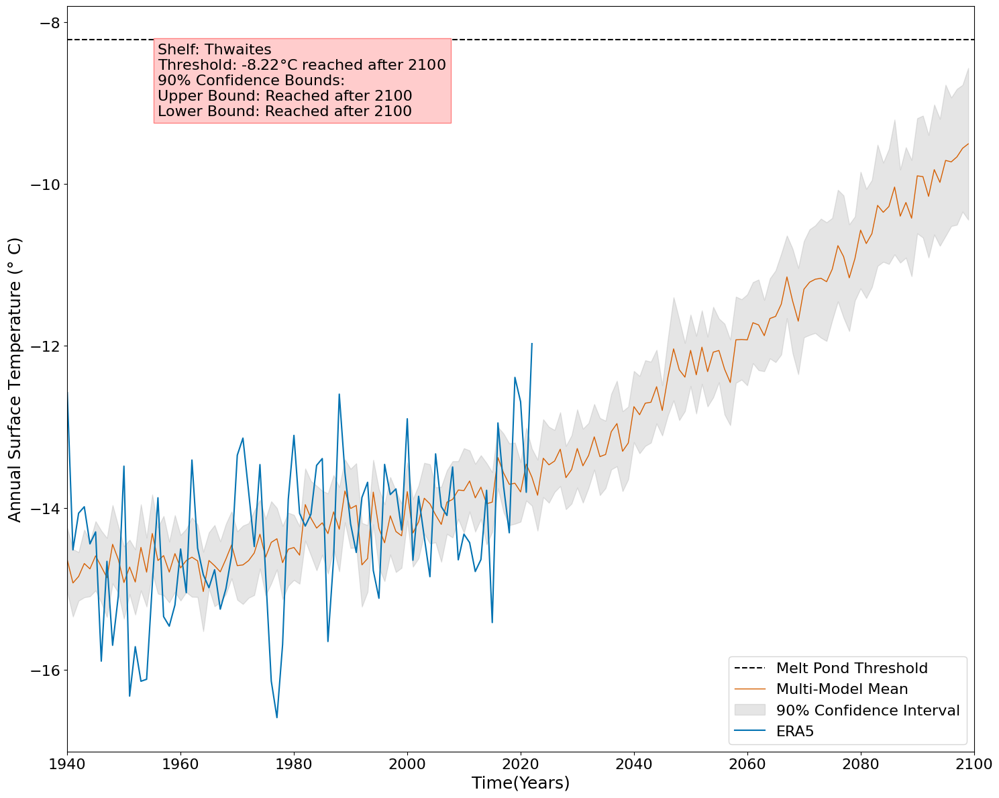

<Figure size 640x480 with 0 Axes>

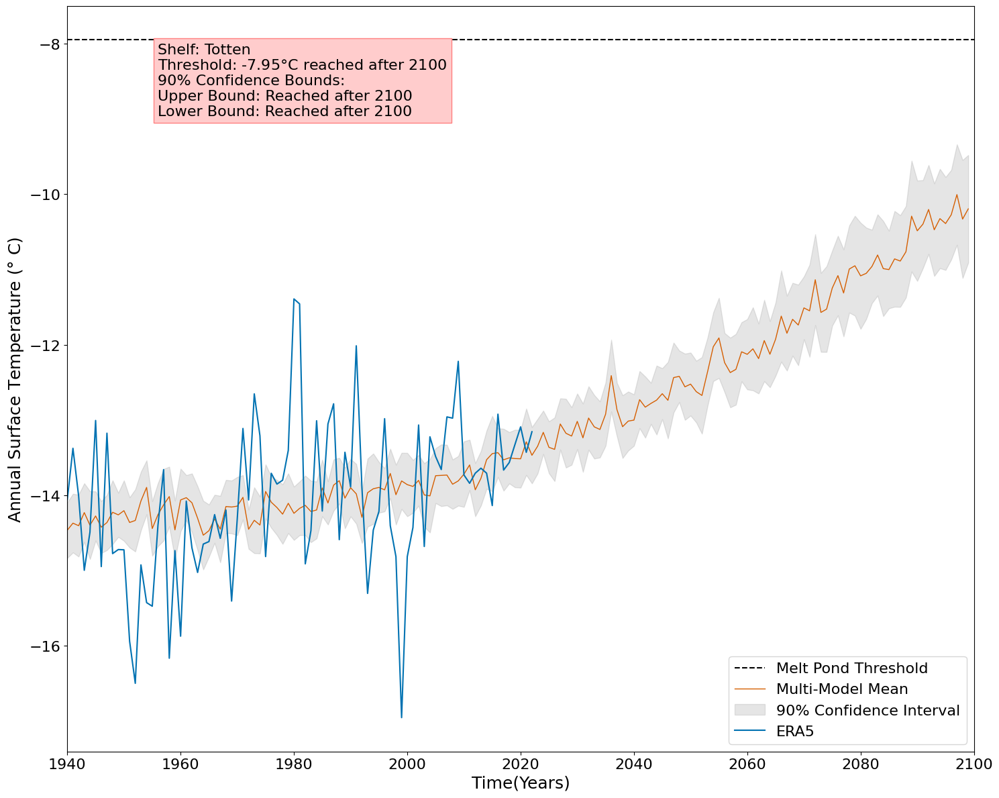

<Figure size 640x480 with 0 Axes>

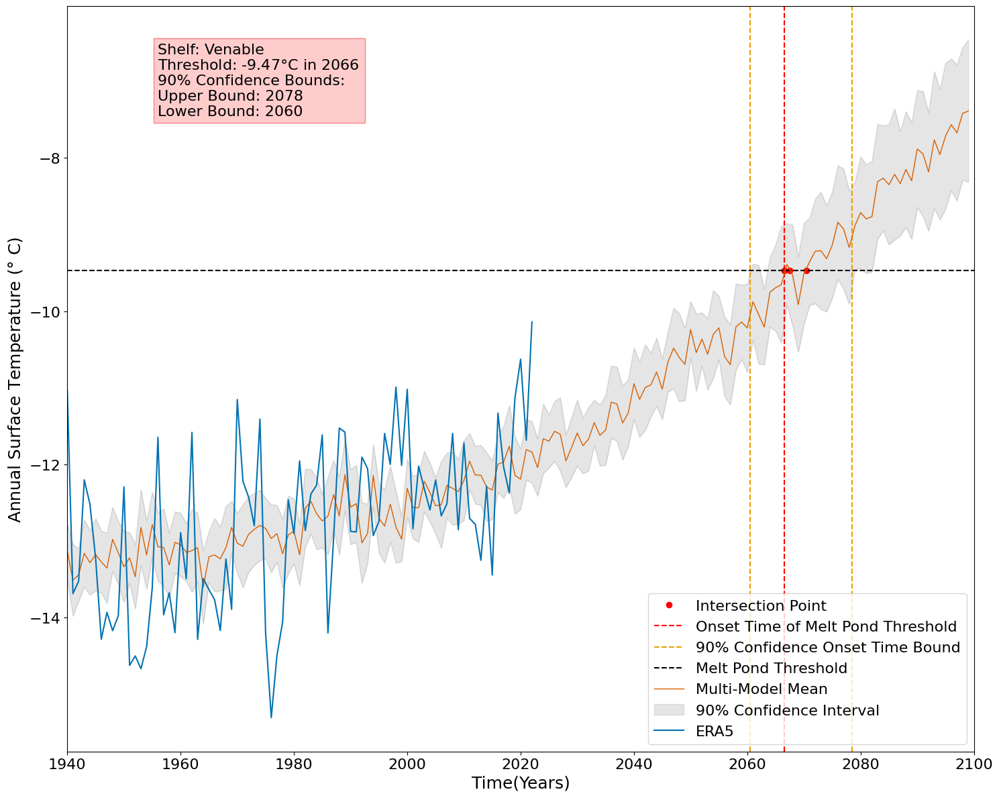

<Figure size 640x480 with 0 Axes>

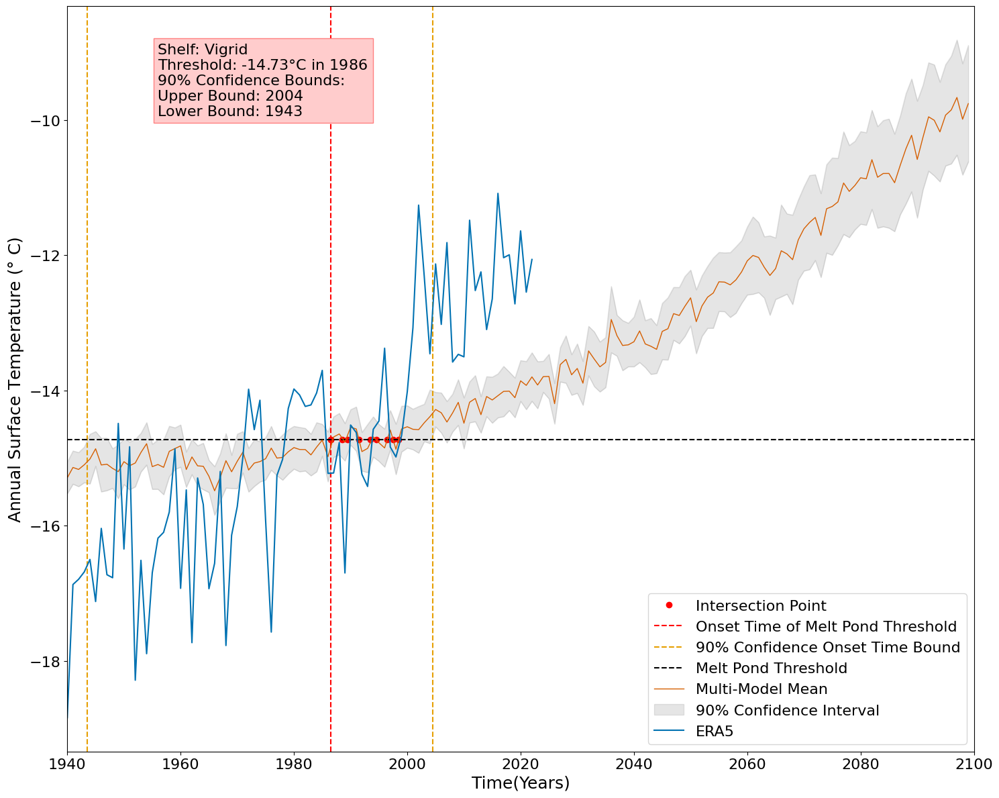

<Figure size 640x480 with 0 Axes>

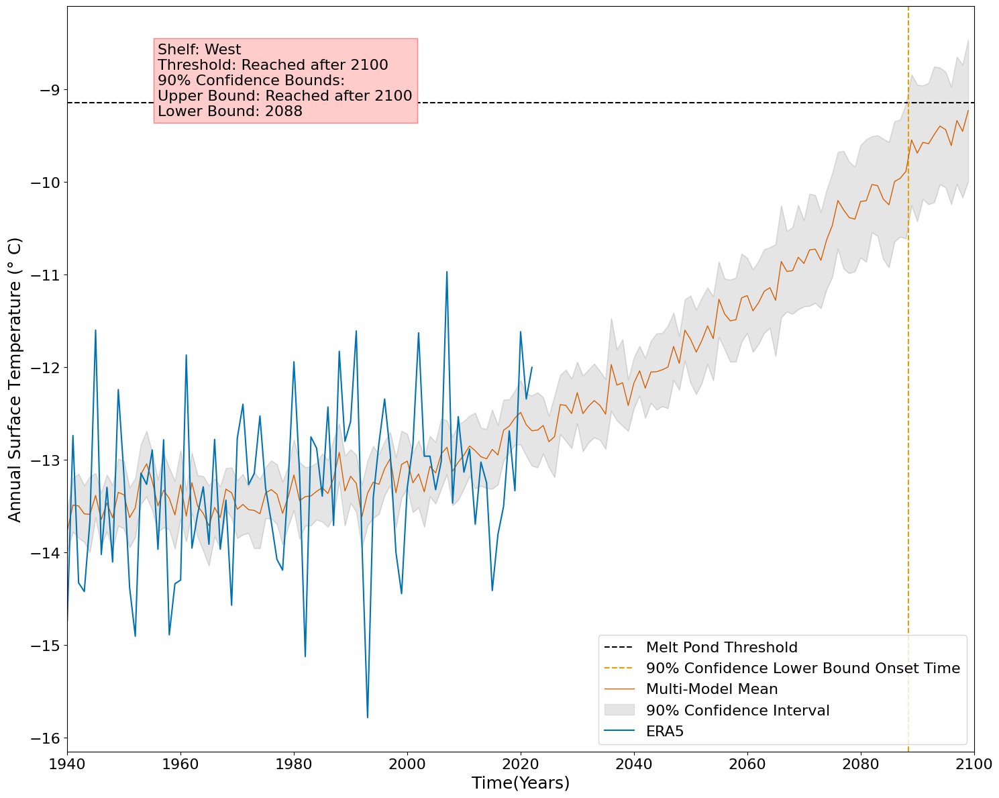

<Figure size 640x480 with 0 Axes>

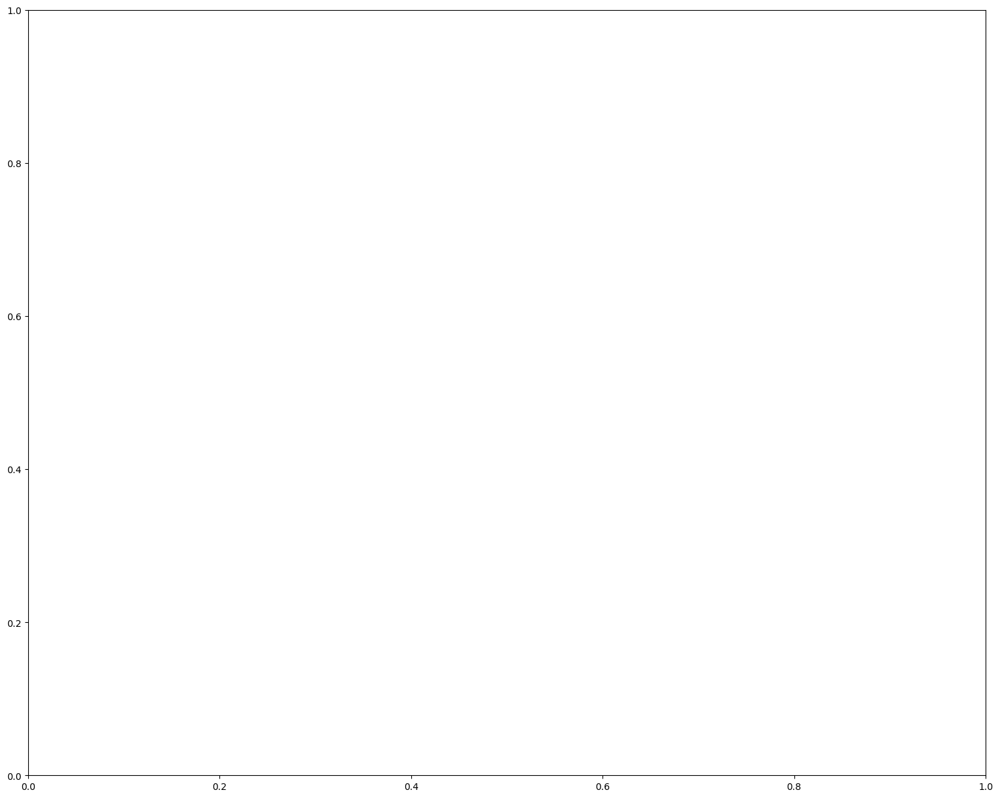

In [28]:
shelf_bias_adjusted_dictionary = {}
shelf_bias_adjusted_dictionary_onset = {}
iceshelf_dictionary(yearly_shelves)

In [39]:
shelf_bias_adjusted_dictionary_onset['Abbot']

,Shelf,Onset Time,90% Confidence upper bound,90% Confidence lower bound,Onset Temp,Onset Temp Uncertainty,Model Mean Temp


In [29]:
shelf_name = list()
onset = list()


for key in shelf_bias_adjusted_dictionary_onset: 
    shelf_name.append(key)
    if shelf_bias_adjusted_dictionary_onset[key]['Onset Time'].size > 0:
        time = shelf_bias_adjusted_dictionary_onset[key]['Onset Time'][0]
    else: 
        time = 2140
    onset.append(time)   

onset_x = pd.DataFrame(list(zip(shelf_name,onset)),columns=['Shelf','Onset Time'])  
onset_x
onset_x.at[10,'Onset Time'] = 1940
onset_x

,Shelf,Onset Time
0,Abbot,2140.0
1,Amery,1944.5
2,Atka,2140.0
3,Baudouin,2035.5
4,Borchgrevink,2057.5
5,Conger Glenzer,2096.5
6,Cook,2069.5
7,Cosgrove,2066.5
8,Crosson,2140.0
9,Dotson,2140.0


In [40]:
for key in shelf_bias_adjusted_dictionary_onset:
    print(shelf_bias_adjusted_dictionary_onset[key]['Onset Time'])


Series([], Name: Onset Time, dtype: object)
0    1944.5
Name: Onset Time, dtype: float64
Series([], Name: Onset Time, dtype: object)
0    2035.5
Name: Onset Time, dtype: float64
0    2057.5
Name: Onset Time, dtype: float64
0    2096.5
Name: Onset Time, dtype: float64
0    2069.5
Name: Onset Time, dtype: float64
0    2066.5
Name: Onset Time, dtype: float64
Series([], Name: Onset Time, dtype: object)
Series([], Name: Onset Time, dtype: object)
Series([], Name: Onset Time, dtype: object)
0    2099.0
Name: Onset Time, dtype: float64
Series([], Name: Onset Time, dtype: object)
0    2034.5
Name: Onset Time, dtype: float64
Series([], Name: Onset Time, dtype: object)
Series([], Name: Onset Time, dtype: object)
0    2099.0
Name: Onset Time, dtype: float64
Series([], Name: Onset Time, dtype: object)
0    1988.5
Name: Onset Time, dtype: float64
0    2041.5
Name: Onset Time, dtype: float64
Series([], Name: Onset Time, dtype: object)
0    2059.5
Name: Onset Time, dtype: float64
Series([], Name: Ons

In [ ]:
if onset_x['Onset Time'] < 2100: 
    

In [21]:
def min_and_max_finder(dictionary,model_number):
    max_list = list()
    min_list = list() 
    
    for key in dictionary:
        temp_max_list = list()
        temp_min_list = list()
        for i in range(len(dictionary[key]['cropped temp'][model_number])):
            max_temp = np.max(dictionary[key]['cropped temp'][model_number][i])
            temp_max_list.append(max_temp)
            min_temp = np.min(dictionary[key]['cropped temp'][model_number][i])
            temp_min_list.append(min_temp)

        max_list.append(np.max(temp_max_list))
        min_list.append(np.min(temp_min_list))
        
    return max_list,min_list

In [22]:
import matplotlib.path as mpath
theta = np.linspace(0, 2*np.pi, 100)
map_circle = mpath.Path(np.vstack([np.sin(theta), np.cos(theta)]).T * 0.5 + [0.5, 0.5])

In [24]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/scripts/all_shelves_model_mean_yearly_value.pkl', 'rb') as f:
    all_shelves_model_mean_yearly_value = pickle.load(f)

In [46]:
all_shelves_model_mean_yearly_value

{'Abbot': 0.4327213378756694,
 'Amery': 0.20454428110556244,
 'Atka': 2.9376454295075853,
 'Baudouin': 1.1341053253265627,
 'Borchgrevink': 1.1251071003568407,
 'Conger Glenzer': 0.294862434372695,
 'Cook': -0.24163125974413363,
 'Cosgrove': 0.42386203109862297,
 'Crosson': 0.6863657376007226,
 'Dotson': 1.204384353910082,
 'Drygalski': 0.35411762574386263,
 'Ekstrom': 3.5192334967484076,
 'Filchner': 2.111019989653805,
 'George VI': -3.2677502159356373,
 'Getz': 0.775293765075911,
 'Holmes': -1.320893565157235,
 'Jelbart': 2.4472345133953533,
 'Land': 2.0004025819282,
 'LarsenB': 3.241598157904642,
 'LarsenC': 2.4191237609490677,
 'LarsenD': 1.2761211350185828,
 'Lazarev': 1.743604878662267,
 'Mariner': -1.825975784822631,
 'Mertz': 0.5209905968983823,
 'Moscow University': -0.6501363875180116,
 'Nansen': -1.860309192988105,
 'Nickerson': 2.187870124993316,
 'Nivl': 0.8899199319100766,
 'pine island': -1.0149046648349824,
 'Prince Harald': -1.8811516156649242,
 'Quar': 2.9027275619562

In [116]:
avg_ross = (all_shelves_model_mean_yearly_value['Ross East']+all_shelves_model_mean_yearly_value['Ross West'])/2
print(avg_ross)

2.5829476874300075


In [117]:
all_shelves_model_mean_yearly_value['Ross East'] = avg_ross
all_shelves_model_mean_yearly_value['Ross West'] = avg_ross
all_shelves_model_mean_yearly_value

{'Abbot': 0.4327213378756694,
 'Amery': 0.20454428110556244,
 'Atka': 2.9376454295075853,
 'Baudouin': 1.1341053253265627,
 'Borchgrevink': 1.1251071003568407,
 'Conger Glenzer': 0.294862434372695,
 'Cook': -0.24163125974413363,
 'Cosgrove': 0.42386203109862297,
 'Crosson': 0.6863657376007226,
 'Dotson': 1.204384353910082,
 'Drygalski': 0.35411762574386263,
 'Ekstrom': 3.5192334967484076,
 'Filchner': 2.111019989653805,
 'George VI': -3.2677502159356373,
 'Getz': 0.775293765075911,
 'Holmes': -1.320893565157235,
 'Jelbart': 2.4472345133953533,
 'Land': 2.0004025819282,
 'LarsenB': 3.241598157904642,
 'LarsenC': 2.4191237609490677,
 'LarsenD': 1.2761211350185828,
 'Lazarev': 1.743604878662267,
 'Mariner': -1.825975784822631,
 'Mertz': 0.5209905968983823,
 'Moscow University': -0.6501363875180116,
 'Nansen': -1.860309192988105,
 'Nickerson': 2.187870124993316,
 'Nivl': 0.8899199319100766,
 'pine island': -1.0149046648349824,
 'Prince Harald': -1.8811516156649242,
 'Quar': 2.9027275619562

In [25]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/scripts/all_shelves_model_mean_seasonal_value.pkl', 'rb') as f:
    all_shelves_model_mean_seasonal_value = pickle.load(f)

In [105]:
avg_ross = (all_shelves_model_mean_seasonal_value['Ross East']+all_shelves_model_mean_seasonal_value['Ross West'])/2
print(avg_ross)

3.2508178649551405


In [108]:
all_shelves_model_mean_seasonal_value['Ross East'] = avg_ross
all_shelves_model_mean_seasonal_value['Ross West'] = avg_ross
all_shelves_model_mean_seasonal_value

{'Abbot': 1.934894972749733,
 'Amery': 1.949438431450848,
 'Atka': 2.6160779488435852,
 'Baudouin': 2.0891636406855283,
 'Borchgrevink': 2.2127668178387747,
 'Conger Glenzer': 0.9963723117719961,
 'Cook': -0.010468996761629382,
 'Cosgrove': 2.0168670865281175,
 'Crosson': 2.415915978230407,
 'Dotson': 2.872943097665481,
 'Drygalski': 0.8955925499961488,
 'Ekstrom': 3.231817462916572,
 'Filchner': 3.9232049415753067,
 'George VI': -1.638556133603341,
 'Getz': 1.7900625924304645,
 'Holmes': -0.18909647500424287,
 'Jelbart': 2.369080818427171,
 'Land': 2.2259602227312487,
 'LarsenB': 1.0402513952116605,
 'LarsenC': 0.5208524740834338,
 'LarsenD': -0.14485623449001558,
 'Lazarev': 2.098437416494178,
 'Mariner': -1.6759139989950218,
 'Mertz': 1.123839141256677,
 'Moscow University': 0.3071985535912034,
 'Nansen': -0.09683394114996505,
 'Nickerson': 2.443812162468604,
 'Nivl': 1.1283530894164207,
 'pine island': 0.9781474535190108,
 'Prince Harald': -0.25301073188490936,
 'Quar': 2.884242529

In [26]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/scripts/std_of_models_seasonal.pkl', 'rb') as f:
    std_of_models_seasonal = pickle.load(f)

In [27]:
with open('/raid01/mafields/tas/MODELS_filtered/ssp585/jupyter/scripts/std_of_models_yearly.pkl', 'rb') as f:
    std_of_models_yearly = pickle.load(f)

In [121]:
std_of_models_seasonal

{'Abbot': 2.5571115908684123,
 'Amery': 4.083436149095936,
 'Atka': 2.633744666626753,
 'Baudouin': 2.8897582805858595,
 'Borchgrevink': 3.0937191047909085,
 'Conger Glenzer': 2.6146585554233353,
 'Cook': 2.643310326891587,
 'Cosgrove': 2.6694041014487,
 'Crosson': 2.6900924362665872,
 'Dotson': 2.5398356873573817,
 'Drygalski': 3.040628687686804,
 'Ekstrom': 2.5963082943017173,
 'Filchner': 4.315479124415514,
 'George VI': 2.517910822785116,
 'Getz': 2.4962514534437634,
 'Holmes': 2.746221210831909,
 'Jelbart': 2.7699214101817637,
 'Land': 2.6781069359112384,
 'LarsenB': 1.9484235212745078,
 'LarsenC': 2.0530663432783456,
 'LarsenD': 2.5276296066927206,
 'Lazarev': 2.9948579630890424,
 'Mariner': 3.288518510265251,
 'Mertz': 2.776410006648782,
 'Moscow University': 3.1108355093288536,
 'Nansen': 3.661952256374762,
 'Nickerson': 2.5237741639872557,
 'Nivl': 3.115121625853812,
 'pine island': 2.8320165939363124,
 'Prince Harald': 3.1096580608402,
 'Quar': 2.6293260188050915,
 'Rennick':

In [34]:
def plotting_iceshelf(dictionary,n):    
    
    
    fig = plt.figure(figsize=(15,12))
    ax = plt.axes(projection=ccrs.SouthPolarStereo())
    ax.set_global()
    ax.coastlines(resolution="110m",linewidth=1)
    gl = ax.gridlines(draw_labels=False,linestyle='--',color='black', dms=True, x_inline=False, y_inline=True)
    XTEXT_SIZE = 15
    YTEXT_SIZE = 15
    #gl.xlabel_style = {'size': XTEXT_SIZE, 'color': 'k', 'rotation':45, 'ha':'right'}
    #gl.ylabel_style = {'size':YTEXT_SIZE, 'color': 'k', 'weight': 'normal'}
    ax.coastlines(resolution="110m",linewidth=1)
    ax.set_extent([-180,180, -90, -65],ccrs.PlateCarree())
    #ax.set_boundary(map_circle, transform=ax.transAxes)
    ax.add_feature(LAND)
    #ax.add_feature(BORDERS)
    #ax.add_feature(OCEAN)
    
    vmin=1940
    vmax=2150
    
    clevs = np.arange(np.floor(vmin).astype('int'),np.ceil(vmax).astype('int'),1)
    
    for key in dictionary: 
        
        index = np.where(onset_x['Shelf'] == key )[0][0]
        
        shelf_name = onset_x['Shelf'][index]
        
        year = onset_x['Onset Time'][index]
        
        shelf_df = dictionary[key]
        
        Model_name = shelf_df['Model'][n]
        
        temp = np.zeros((len(shelf_df['cropped temp'][n]),len(shelf_df['cropped temp'][n][0])))
        for i in range(len(shelf_df['cropped temp'][n])):
            temp[i] = shelf_df['cropped temp'][n][i]
            
        var = np.mean(temp, axis = 0) #2meter surface temperture
        var_2 = np.full(len(var),year)
        
        lat = shelf_df['cropped lat'][n] #latitude
        lon = shelf_df['cropped lon'][n] #longitude

        data_pl = var_2

        lat_pl = lat
        lon_pl = lon

        plt.tricontourf(lon_pl,lat_pl,data_pl,clevs,transform=ccrs.PlateCarree(),cmap='Reds_r')
        #CLS = plt.clabel(CS, inline=1, fontsize=10)
        
    cb = plt.colorbar(ax=ax, orientation="vertical",ticks=[2100,2120,2140])
    cb.set_label(r'Onset Year',size=20,rotation=270) 
    cb.ax.set_yticklabels(['2100','Threshold Not Met','No Melt Threshold Given'])
    #cb.ax.set_yticklabels(['1940', '1960', '1980','2000','2020','2040','2060','2080','2100','Threshold Not Met','No Melt Threshold Given'])
    tick_font_size = 12
    cb.ax.tick_params(labelsize=tick_font_size)
    
    #plt.savefig('/raid01/mafields/tas/MODELS_filtered/ssp585/figures/shelves_plots/seasonal/seasonal_shelves_'+Model_name+'.png')
    plt.close()
    
    return fig


In [32]:
def plotting_iceshelf_temp(dictionary,n):    
    
    
    fig = plt.figure(figsize=(15,12))
    ax = plt.axes(projection=ccrs.SouthPolarStereo())
    ax.set_global()
    ax.coastlines(resolution="110m",linewidth=1)
    gl = ax.gridlines(draw_labels=False,linestyle='--',color='black', dms=True, x_inline=False, y_inline=True)
    XTEXT_SIZE = 15
    YTEXT_SIZE = 15
    #gl.xlabel_style = {'size': XTEXT_SIZE, 'color': 'k', 'rotation':45, 'ha':'right'}
    #gl.ylabel_style = {'size':YTEXT_SIZE, 'color': 'k', 'weight': 'normal'}
    ax.coastlines(resolution="110m",linewidth=1)
    ax.set_extent([-180,180, -90, -65],ccrs.PlateCarree())
    #ax.set_boundary(map_circle, transform=ax.transAxes)
    ax.add_feature(LAND)
    #ax.add_feature(BORDERS)
    #ax.add_feature(OCEAN)
    
    
    
    vmin=-5
    vmax=6
    
    print(np.floor(vmin).astype('int'),np.ceil(vmax))
    clevs = np.arange(np.floor(vmin).astype('int'),np.ceil(vmax).astype('int'),1)
    
    for key in dictionary: 
        
        mean_temp = all_shelves_model_mean_yearly_value[key]
        std = std_of_models_yearly[key]
        #print(std)
        
        shelf_df = dictionary[key]
        
        Model_name = shelf_df['Model'][n]
        
        temp = np.zeros((len(shelf_df['cropped temp'][n]),len(shelf_df['cropped temp'][n][0])))
        for i in range(len(shelf_df['cropped temp'][n])):
            temp[i] = shelf_df['cropped temp'][n][i]
            
        var = np.mean(temp, axis = 0) #2meter surface temperture
        var_2 = np.full(len(var),mean_temp)
        
        lat = shelf_df['cropped lat'][n] #latitude
        lon = shelf_df['cropped lon'][n] #longitude

        data_pl = var_2

        lat_pl = lat
        lon_pl = lon
        
        lat_scatter = np.mean(lat_pl)+.2
        lon_scatter = np.mean(lon_pl)+.2
        
        #print(lat_scatter,lon_scatter)

        plt.tricontourf(lon_pl,lat_pl,data_pl,clevs,transform=ccrs.PlateCarree(),cmap='RdBu_r')
        #plt.text(lon_scatter,lat_scatter,'{:.1f}'.format(std),transform=ccrs.PlateCarree(), fontsize = 12, color = 'black',bbox=dict(facecolor='white', alpha=0.5))
        #CLS = plt.clabel(CS, inline=1, fontsize=10)
        
    cb = plt.colorbar(ax=ax, orientation="vertical")
    plt.tight_layout()
    #cb.set_label(r'Multi-Model Mean Austral Summer (DJF) Temperature Bias ($\degree$ C)',size=20,rotation=270,labelpad=30) 
    #ax.yaxis.set_label_position("right")
    cb.ax.set_yticklabels(['2100','Threshold Not Met','No Melt Threshold Given'])
    tick_font_size = 12
    cb.ax.tick_params(labelsize=16)
    
    plt.savefig('/raid01/mafields/tas/MODELS_filtered/ssp585/figures/shelves_plots/seasonal/seasonal_shelves_'+Model_name+'.png',)
    plt.close()
    
    return fig


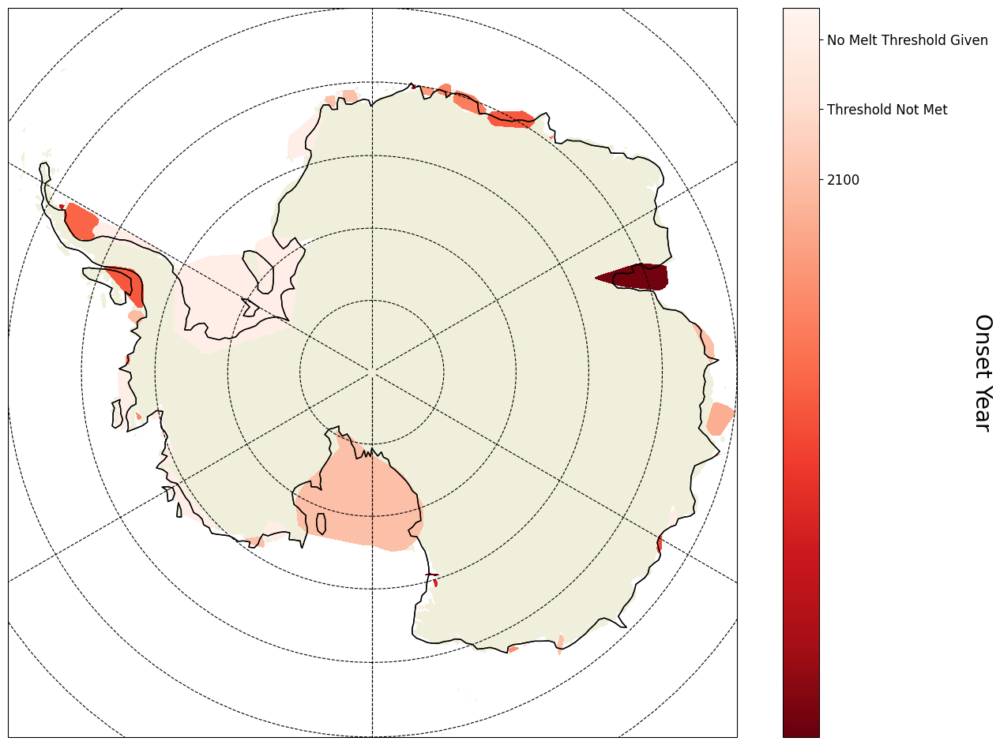

In [35]:
plotting_iceshelf(yearly_shelves,0)

In [66]:
x = bias_analysis_monthly('LarsenB')

LarsenB
['E3SM-1-1', 'CAS-ESM2-0', 'KIOST-ESM', 'E3SM-Project', 'CAMS-CSM1-0', 'MPI-ESM1-2-HR', 'INM-CM4-8', 'INM-CM5-0', 'FGOALS-f3-L', 'AWI-CM-1-1-MR', 'TaiESM1', 'CMCC-CM2-SR5', 'CMCC-ESM2', 'IPSL-CM6A-LR', 'EC-Earth3', 'IITM-ESM', 'NorESM2-MM', 'FGOALS-g3', 'ACCESS-ESM1-5', 'NorESM2-LM', 'ACCESS-CM2', 'GFDL-ESM4', 'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'NESM3', 'MRI-ESM2-0', 'CanESM5', 'MIROC6', 'CESM2-WACCM', 'E3SM-1-1-ECA', 'MPI-ESM1-2-LR', 'Model Mean'] [[1940. 1940. 1940. 1940. 1940. 1940. 1940. 1940. 1940. 1940. 1940. 1940.
  1941. 1941. 1941. 1941. 1941. 1941. 1941. 1941. 1941. 1941. 1941. 1941.
  1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
  1943. 1943. 1943. 1943. 1943. 1943. 1943. 1943. 1943. 1943. 1943. 1943.
  1944. 1944. 1944. 1944. 1944. 1944. 1944. 1944. 1944. 1944. 1944. 1944.
  1945. 1945. 1945. 1945. 1945. 1945. 1945. 1945. 1945. 1945. 1945. 1945.
  1946. 1946. 1946. 1946. 1946. 1946. 1946. 1946. 1946. 1946. 1946. 1946.
  1947. 1947. 1947.

  2022. 2022. 2022. 2022. 2022. 2022. 2022. 2022. 2022. 2022. 2022. 2022.]] [[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.
   7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.
   1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.
   7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.
   1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.
   7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.
   1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.
   7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.
   1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.
   7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.
   1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.
   7.  8.  9. 10. 11. 12.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12.
   1.  2.  3.  4.  5.  6.  7.  8.  9

<Figure size 640x480 with 0 Axes>

In [14]:
#define function to calculate cv
cv = lambda x: np.std(x, ddof=1) / np.mean(x)  

#calculate CV
CV_per_shelf = {}

for key in shelf_bias_adjusted_dictionary:
    model_names = list()
    test_shelf = shelf_bias_adjusted_dictionary[key]['spatial average']
    cv_model_shelf = np.zeros((len(test_shelf)+1))
    reanalysis_monthly = monthly_reanalysis[key]['temp spatial average'][0]
    for i in range(len(test_shelf)):
        model_names.append(shelf_bias_adjusted_dictionary[key]['Model Names'][i])
        cv_model_shelf[i] = cv(test_shelf[i])
    cv_model_shelf[-1] = cv(reanalysis_monthly)
    model_names.append('ERA5')
    
    df = pd.DataFrame(list(zip(model_names,cv_model_shelf)),columns=['Model Names','Coefficient of Variation'])
    
    CV_per_shelf[key] = df


In [15]:
CV_per_shelf

{'Abbot':          Model Names  Coefficient of Variation
 0           E3SM-1-1                 -0.674733
 1         CAS-ESM2-0                 -0.770579
 2          KIOST-ESM                 -0.556704
 3       E3SM-Project                 -0.668328
 4        CAMS-CSM1-0                 -0.734722
 5      MPI-ESM1-2-HR                 -0.474107
 6          INM-CM4-8                 -0.730644
 7          INM-CM5-0                 -0.696356
 8        FGOALS-f3-L                 -0.543510
 9      AWI-CM-1-1-MR                 -0.456184
 10           TaiESM1                 -0.419742
 11      CMCC-CM2-SR5                 -0.566941
 12         CMCC-ESM2                 -0.564030
 13      IPSL-CM6A-LR                 -0.530856
 14         EC-Earth3                 -0.765619
 15          IITM-ESM                 -0.982555
 16        NorESM2-MM                 -0.540696
 17         FGOALS-g3                 -0.419632
 18     ACCESS-ESM1-5                 -0.511191
 19        NorESM2-LM          

In [16]:
def iceshelf_gridsize(dictionary,type_of_analysis):
    
    gridsize_shelves = {}
    
    for key in dictionary:    
        if type_of_analysis == 'seasonal':
            shelf_gridsize = seasonal_shelves[key]['cropped lat'][0].size
            gridsize_shelves[key] = shelf_gridsize
    
        elif type_of_analysis == 'yearly':
            shelf_gridsize = yearly_shelves[key]['cropped lat'][0].size
            gridsize_shelves[key] = shelf_gridsize
        
        elif type_of_analysis == 'monthly':
            shelf_gridsize = monthly_shelves[key]['cropped lat'][0].size
            gridsize_shelves[key] = shelf_gridsize
                
    return gridsize_shelves

In [17]:
##Weights for All Shelves

gridsize_shelves = iceshelf_gridsize(monthly_shelves,'monthly')

total_shelf_weights = {}

for key in gridsize_shelves: 
    total_shelf_weights[key] = gridsize_shelves[key]/sum(gridsize_shelves.values())

print(total_shelf_weights)

{'Abbot': 0.014959723820483314, 'Amery': 0.024793388429752067, 'Atka': 0.000941521079610838, 'Baudouin': 0.012972068207971544, 'Borchgrevink': 0.00878753007636782, 'Brunt Stancomb': 0.01945810231195732, 'Conger Glenzer': 0.0004184538131603724, 'Cook': 0.0012553614394811173, 'Cosgrove': 0.0011507479861910242, 'Crosson': 0.0015692017993513966, 'Dotson': 0.003138403598702793, 'Drygalski': 0.0008369076263207448, 'Ekstrom': 0.0025107228789622345, 'Filchner': 0.08525996443142587, 'George VI': 0.01046134532900931, 'Getz': 0.01715660633957527, 'Holmes': 0.0008369076263207448, 'Jelbart': 0.00439376503818391, 'Land': 0.0003138403598702793, 'LarsenB': 0.0006276807197405586, 'LarsenC': 0.01642431216654462, 'LarsenD': 0.010147504969139031, 'Lazarev': 0.0036614708651532585, 'Mariner': 0.0014645883460613035, 'Mertz': 0.001987655612511769, 'Moscow University': 0.0015692017993513966, 'Nansen': 0.000941521079610838, 'Nickerson': 0.004079924678313631, 'Nivl': 0.0028245632388325136, 'pine island': 0.00355

In [18]:
def grouping_bias_analysis(dictionary,weights,keys):
    
    applied_weights = {}
    
    for key in keys:
        weighted_bias = dictionary[key]['Coefficient of Variation'] * weights[key]
        df = pd.concat([dictionary[key]['Model Names'], weighted_bias], axis=1)
        applied_weights[key] = df
        
    return applied_weights

In [19]:
def bias_analysis_shelf_alphabet(dictionary):
    
    new_dictionary = {}
    
    for key in dictionary:
        new_dictionary[key] = dictionary[key].sort_values('Model Names')
    
    return new_dictionary

In [20]:
CV_per_shelf_sorted = bias_analysis_shelf_alphabet(CV_per_shelf)

keys = CV_per_shelf_sorted.keys()

CV_applied_weights = grouping_bias_analysis(CV_per_shelf_sorted,total_shelf_weights,keys)

In [21]:
CV_applied_weights

{'Abbot':          Model Names  Coefficient of Variation
 20        ACCESS-CM2                 -0.008245
 18     ACCESS-ESM1-5                 -0.007647
 9      AWI-CM-1-1-MR                 -0.006824
 4        CAMS-CSM1-0                 -0.010991
 1         CAS-ESM2-0                 -0.011528
 28       CESM2-WACCM                 -0.007981
 11      CMCC-CM2-SR5                 -0.008481
 12         CMCC-ESM2                 -0.008438
 26           CanESM5                 -0.007078
 0           E3SM-1-1                 -0.010094
 29      E3SM-1-1-ECA                 -0.009973
 3       E3SM-Project                 -0.009998
 14         EC-Earth3                 -0.011453
 22     EC-Earth3-Veg                 -0.011822
 23  EC-Earth3-Veg-LR                 -0.011100
 31              ERA5                 -0.007046
 8        FGOALS-f3-L                 -0.008131
 17         FGOALS-g3                 -0.006278
 21         GFDL-ESM4                 -0.007348
 15          IITM-ESM          

In [24]:
dictionary1 = CV_applied_weights
model_CV = list()
names = list()

for key in dictionary1:
    for i in range(len(dictionary1[key])):
        values = np.zeros(len(dictionary1))
        model_name = CV_applied_weights[key]['Model Names'][i]
        names.append(model_name)

        k = 0
        for key in dictionary1:
            x = dictionary1[key]['Coefficient of Variation'][i]
            values[k] = x
            k += 1

        weight = np.sum(values)
        model_CV.append(weight)

df = pd.DataFrame(list(zip(names,model_CV)),columns=['Model Names','Weighted CV'])
weighted_cv = df[0:32]
weighted_cv = weighted_cv.sort_values("Weighted CV",ascending=False)

In [29]:
%pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [37]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.style.use('seaborn-v0_8-colorblind')

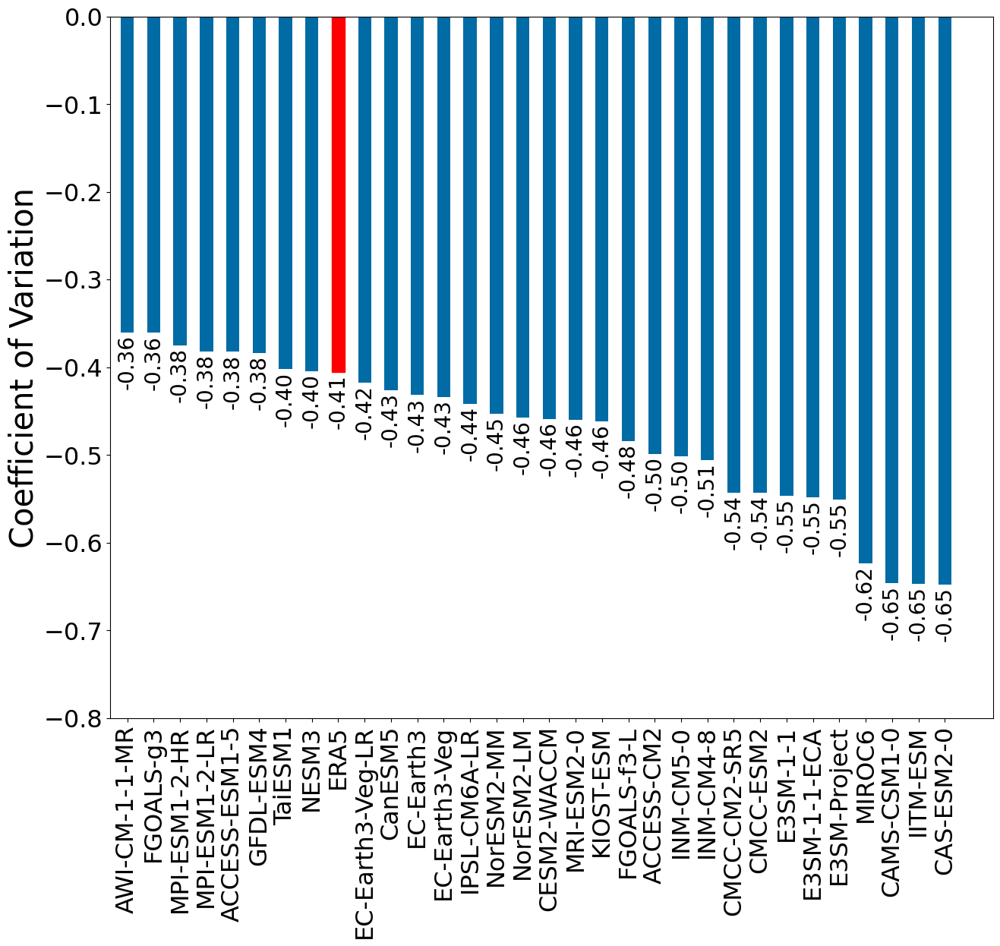

In [71]:
x = weighted_cv['Model Names']
y = weighted_cv['Weighted CV']

fig, (ax2) = plt.subplots(figsize=(15, 12))

bars = ax2.bar(x,y,width = 0.5)
bars[8].set_color('r')
ax2.bar_label(bars,fmt = '%1.2f',padding=2,label_type='edge',fontsize=20,rotation='vertical')
ax2.set_xlim(left=min(y))
ax2.set_ylim(-0.8)
ax2.set_ylabel(r"Coefficient of Variation", fontsize = 30)
ax2.tick_params(labelsize=23)
plt.xticks(rotation=90)
z



In [33]:
style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']